In [383]:
import os
import sys
src_path = os.path.abspath(os.path.join(os.getcwd(), '..', 'src'))
sys.path.append(src_path)
from optimization_logic import *

import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

import warnings
warnings.filterwarnings("ignore")

#Plotting styles
# plt.style.use('ggplot')
plt.rcParams.update(
{"figure.figsize": (12, 5),
#  'font.family': 'serif',
"text.usetex": False,
"axes.titlesize" : 12,
"axes.labelsize" : 10,
# "axes.labelweight" : "bold",
"lines.linewidth": 1,
"lines.markersize" : 5,
"legend.fontsize": 8,
"legend.title_fontsize" : 9,
"xtick.labelsize" : 8,
"ytick.labelsize" : 8})


# Parameters

In [384]:
"""
SIZE: maximal power content of the battery. Units have to be chosen here and be consistent with other power/energy related attributes
POWER_UP: maximal power for discharging; units are analogous to units as size (e.g. kW -> kWh, MW -> MWh)
POWER_DOWN: maximal power for charging; units are analogous to units as size (e.g. kW -> kWh, MW -> MWh)
CHARGE_EFFICIENCY: efficiency factor to compute SoC change when charging the asset, fraction between [0,1]
DISCHARGE_EFFICIENCY: efficiency factor to compute SoC change when discharging the asset, fraction between [0,1]

INIT_SOC: initial energy content of the battery at the start of simulation period (in energy units). (default = None -> size/2 = 50%)
END_SOC: energy content of the battery at end of each day (in energy units). (default = None -> no such constraint)
# the energy content at the start of each day (after the very first day) is taken as the end_SOC for previous day

end_soc_limit_type: the kind of contraint applied for end of day SOC. Chose between ['equal_to', 'greater_than_or_equal_to', 'less_than_or_equal_to']. 
                    Applied only when END_SOC != None

MANUAL_SOC_MIN = minimum allowed SOC
MANUAL_SOC_MAX = maximum allowed SOC

MAX_THROUGHPUT_CYCLES: maximum throughput/discharge cycles allowed in 1 day
THROUGHPUT_SIZE: throughput size (MWh) upon which a 'cycle' is defined, daily discharge throughput <= MAX_THROUGHPUT_CYCLES * THROUGHPUT_SIZE MWh
TSTEP: fraction of an hour (1/N), where N denotes the frequency of settlements made per hour

SOLUTION_TIME_LIMIT_SEC = max time allowed for the optimization algo to find a solution (in sec.)
INTEGER_PN = True if the setpoints (MW) can only be integer values, else False

assume_perfect_foresight = True if perfect foresight on DA prices is to be assumed, otherwise False
                           When False, the optimization will be done on DA forecast, and settlement on actuals
"""

###############################
#       BESS specifics        #
###############################

SIZE = 100               # MWh - default 56.4
POWER_UP = 50            # MW - default 49, 
POWER_DOWN  = 50         # MW - default 49

RTE = 0.88                                # round trip efficiency
CHARGE_EFFICIENCY = np.sqrt(RTE)          #default = sqrt(RTE)
DISCHARGE_EFFICIENCY = np.sqrt(RTE)       #default = sqrt(RTE)

MAX_THROUGHPUT_CYCLES = 2                 # count - default 2.3
THROUGHPUT_SIZE = SIZE                    # MWh
TSTEP = 1                                 # default = 1 for hourly DA market

###############################
#      script technicals      #
###############################

SOLUTION_TIME_LIMIT_SEC = 30  # default 30
INTEGER_PN = False            # default True

###############################
#      DA scpecifics          #
###############################

MANUAL_SOC_MIN = 0           # MWh 
MANUAL_SOC_MAX = SIZE         # MWh

INIT_SOC = 0        # MWh, default = size/2 
END_SOC = 0         # MWh, default = None
end_soc_limit_type = 'equal_to'

###############################
#    Simulation specifics     #
###############################

assume_perfect_foresight = True

###############################
#           Plotting          #
###############################

show_daily_plots = True

###############################
#           Logging           #
###############################

save_setpoint_log = False
save_daily_log = False
save_path = '/simulation_logs/'
save_name_prefix = f'martina_{SIZE}mwh_{POWER_DOWN}mw'


settlement_freq = {0.25: "15min", 0.5: "30min", 1: "H"}


In [385]:
os.getcwd()

'C:\\Users\\Martina\\Downloads\\2025-QUANT-INTERNSHIP-MARTINA-20250203T124011Z-001\\2025-QUANT-INTERNSHIP-MARTINA\\project\\task2_week2\\notebooks'

# Data

In [386]:
data_files_path = os.getcwd()+'/'
file_name = '../src/data/processed/gb_epex_da_actuals.csv'
main_data = pd.read_csv(data_files_path+'/'+file_name)

In [387]:
ref_day_data = pd.read_csv('../src/data/processed/kmeans_reference_mapping_approach2.csv')
ref_day_data.tail()

,delivery_date,reference_date
148,2024-10-26,2024-10-23
149,2024-10-27,2024-10-19
150,2024-10-28,2024-10-25
151,2024-10-29,2024-10-28
152,2024-10-30,2024-10-29


In [388]:
ref_day_data.head()

,delivery_date,reference_date
0,2024-05-31,2024-05-30
1,2024-06-01,2024-05-31
2,2024-06-02,2024-06-01
3,2024-06-03,2024-06-02
4,2024-06-04,2024-05-31


In [389]:
import re

In [390]:
# ref_day_data = pd.read_csv('../src/data/processed/reference_day_table.csv')
ref_day_data = pd.read_csv('../src/data/processed/kmeans_reference_mapping_approach2.csv')

print("Before processing:")
ref_day_data.info()

ref_day_data['delivery_date'] = pd.to_datetime(ref_day_data['delivery_date']).dt.date
ref_day_data['reference_date'] = pd.to_datetime(ref_day_data['reference_date']).dt.date

ref_day_data.rename(columns={'delivery_date': 'date', 'reference_date': 'reference_day'}, inplace=True)

print("After processing:")
ref_day_data.info()

print(ref_day_data.head())

# Print the DataFrame info for debugging
# print("Before processing:")
# ref_day_data.info()

# # Convert 'date' column to datetime
# ref_day_data['date'] = pd.to_datetime(ref_day_data['date']).dt.date

# # Function to extract the first date from 'closest_reference_days'
# def extract_first_date(row):
#     try:
#         # Use regex to extract all date strings from the row
#         date_matches = re.findall(r"Timestamp\('([^']+)'\)", row)
#         # Return the first date if available
#         return pd.to_datetime(date_matches[0]).date() if len(date_matches) > 0 else None
#     except Exception as e:
#         print(f"Error parsing row: {row}, Error: {e}")
#         return None

# # Apply the function to extract the first closest reference day
# ref_day_data['closest_reference_day'] = ref_day_data['closest_reference_day'].apply(extract_first_date)

# # Drop or keep additional columns as needed (e.g., 'distance')
# ref_day_data = ref_day_data[['date', 'closest_reference_day', 'euclidean_distance']]

# # Print the DataFrame info after processing
# print("After processing:")
# ref_day_data.info()

# # Display the first few rows of the final table
# print(ref_day_data.head())

Before processing:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 153 entries, 0 to 152
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   delivery_date   153 non-null    object
 1   reference_date  153 non-null    object
dtypes: object(2)
memory usage: 2.5+ KB
After processing:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 153 entries, 0 to 152
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   date           153 non-null    object
 1   reference_day  153 non-null    object
dtypes: object(2)
memory usage: 2.5+ KB
         date reference_day
0  2024-05-31    2024-05-30
1  2024-06-01    2024-05-31
2  2024-06-02    2024-06-01
3  2024-06-03    2024-06-02
4  2024-06-04    2024-05-31


In [391]:
main_data.head()

,dtutc,da_price,dtcet,date
0,2023-12-31 23:00:00+00:00,53.2,2024-01-01 00:00:00+01:00,2024-01-01
1,2024-01-01 00:00:00+00:00,50.0,2024-01-01 01:00:00+01:00,2024-01-01
2,2024-01-01 01:00:00+00:00,47.0,2024-01-01 02:00:00+01:00,2024-01-01
3,2024-01-01 02:00:00+00:00,33.0,2024-01-01 03:00:00+01:00,2024-01-01
4,2024-01-01 03:00:00+00:00,25.8,2024-01-01 04:00:00+01:00,2024-01-01


In [392]:
da_data = main_data[["dtutc", "da_price"]].copy()
da_data["dtutc"] = pd.to_datetime(da_data.dtutc, utc=True)


In [393]:
# here we resample the dataset to the frequency of DAM, as specified in param 'TSTEP' above
da_data = da_data.resample(settlement_freq[TSTEP], on = "dtutc", origin="start").mean()
da_data

,da_price
dtutc,
2023-12-31 23:00:00+00:00,53.20
2024-01-01 00:00:00+00:00,50.00
2024-01-01 01:00:00+00:00,47.00
2024-01-01 02:00:00+00:00,33.00
2024-01-01 03:00:00+00:00,25.80
...,...
2024-12-31 18:00:00+00:00,86.00
2024-12-31 19:00:00+00:00,52.05
2024-12-31 20:00:00+00:00,36.00


<Axes: xlabel='dtutc'>

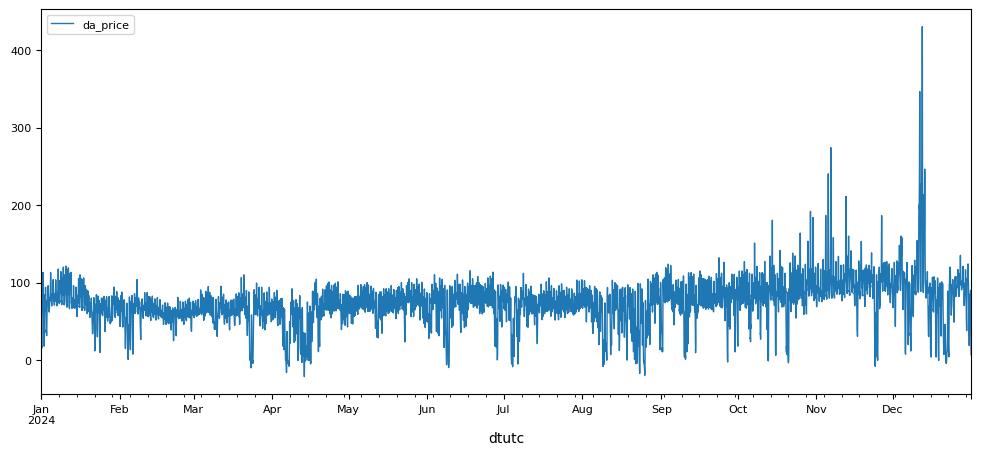

In [394]:
da_data.plot()

In [395]:
# here we add a 'date' column
da_data.reset_index(inplace=True)
da_data["dtcet"] = da_data.dtutc.dt.tz_convert("Europe/Brussels")
da_data["date"] = da_data.dtcet.dt.date


In [396]:
# handling nans:
da_data[da_data.da_price.isna()]


,dtutc,da_price,dtcet,date


In [397]:
da_data.head()

,dtutc,da_price,dtcet,date
0,2023-12-31 23:00:00+00:00,53.2,2024-01-01 00:00:00+01:00,2024-01-01
1,2024-01-01 00:00:00+00:00,50.0,2024-01-01 01:00:00+01:00,2024-01-01
2,2024-01-01 01:00:00+00:00,47.0,2024-01-01 02:00:00+01:00,2024-01-01
3,2024-01-01 02:00:00+00:00,33.0,2024-01-01 03:00:00+01:00,2024-01-01
4,2024-01-01 03:00:00+00:00,25.8,2024-01-01 04:00:00+01:00,2024-01-01


In [398]:
da_data.tail()

,dtutc,da_price,dtcet,date
8779,2024-12-31 18:00:00+00:00,86.00,2024-12-31 19:00:00+01:00,2024-12-31
8780,2024-12-31 19:00:00+00:00,52.05,2024-12-31 20:00:00+01:00,2024-12-31
8781,2024-12-31 20:00:00+00:00,36.00,2024-12-31 21:00:00+01:00,2024-12-31
8782,2024-12-31 21:00:00+00:00,19.90,2024-12-31 22:00:00+01:00,2024-12-31
8783,2024-12-31 22:00:00+00:00,7.00,2024-12-31 23:00:00+01:00,2024-12-31


# Simulations

# Simulation with perfect foresight

- scheduling will be done on the actual prices for each dilivery day
- settlement will be done on the actual prices for each dilivery day

In [399]:
dates = ref_day_data.date.unique()
dates

array([datetime.date(2024, 5, 31), datetime.date(2024, 6, 1),
       datetime.date(2024, 6, 2), datetime.date(2024, 6, 3),
       datetime.date(2024, 6, 4), datetime.date(2024, 6, 5),
       datetime.date(2024, 6, 6), datetime.date(2024, 6, 7),
       datetime.date(2024, 6, 8), datetime.date(2024, 6, 9),
       datetime.date(2024, 6, 10), datetime.date(2024, 6, 11),
       datetime.date(2024, 6, 12), datetime.date(2024, 6, 13),
       datetime.date(2024, 6, 14), datetime.date(2024, 6, 15),
       datetime.date(2024, 6, 16), datetime.date(2024, 6, 17),
       datetime.date(2024, 6, 18), datetime.date(2024, 6, 19),
       datetime.date(2024, 6, 20), datetime.date(2024, 6, 21),
       datetime.date(2024, 6, 22), datetime.date(2024, 6, 23),
       datetime.date(2024, 6, 24), datetime.date(2024, 6, 25),
       datetime.date(2024, 6, 26), datetime.date(2024, 6, 27),
       datetime.date(2024, 6, 28), datetime.date(2024, 6, 29),
       datetime.date(2024, 6, 30), datetime.date(2024, 7, 1),
  

In [400]:
# initiate class object, once at the start of the simulation

# initiate class object
bess_object_dam = day_ahead(
    size=SIZE,
    power_up=POWER_UP,
    power_down=POWER_DOWN,
    timestep=1,
    charge_eff=CHARGE_EFFICIENCY,
    discharge_eff=DISCHARGE_EFFICIENCY,
    manual_soc_max=MANUAL_SOC_MAX,
    manual_soc_min=MANUAL_SOC_MIN,
    init_soc=INIT_SOC,
    end_soc=END_SOC,
    end_soc_limit_type=end_soc_limit_type,
    daily_cycle_max=MAX_THROUGHPUT_CYCLES,
    throughput_size=THROUGHPUT_SIZE,
    solution_time_limit=SOLUTION_TIME_LIMIT_SEC,
    integer_solution=INTEGER_PN,
)

In [401]:
daily_log_foresight = pd.DataFrame()    # daily logs
hourly_log_foresight = pd.DataFrame()   # hourly logs

for d in dates[:]:

    ref_date = None # for d, from your own dataset 

    # actuals, for price settlements
    del_da_data = da_data[da_data.date == d].reset_index(drop=True)
    
    # forecast for scheduling
    
    DAM_run = bess_object_dam.solving(
        dam_actual=del_da_data.da_price,  # for settlements
        dam_fc=del_da_data.da_price,   # for scheduling
        plot=0,  # toggle plotting here
        title_text1="DA Auction 1",
        title_text2=f"{d}",
    )
    DAM_run["dtutc"] = del_da_data.dtutc
    DAM_run["da_actual"] = del_da_data.da_price
    eod_soc = DAM_run.soc_end.iloc[-1]

    # logging
    hourly_log_foresight = pd.concat(
        [
            hourly_log_foresight,
            DAM_run[
                ["net", "soc_start", "soc_end", "dtutc", "da_actual"]
            ],
        ],
        ignore_index=True,
    )
    daily_log_foresight = pd.concat(
        [
            daily_log_foresight,
            pd.DataFrame(
                [
                    {
                        "del_date": d,
                        "ref_date": ref_date,
                        "pnl_da": bess_object_dam.pnl,
                    }
                ]
            ),
        ],
        ignore_index=True,
    )

    bess_object_dam.init_soc = eod_soc
    print(daily_log_foresight.tail(1))

     del_date ref_date   pnl_da
0  2024-05-31     None  5547.83
     del_date ref_date   pnl_da
1  2024-06-01     None  4926.32
     del_date ref_date   pnl_da
2  2024-06-02     None  6602.64
     del_date ref_date   pnl_da
3  2024-06-03     None  3632.98
     del_date ref_date   pnl_da
4  2024-06-04     None  6124.43
     del_date ref_date    pnl_da
5  2024-06-05     None  10150.72
     del_date ref_date   pnl_da
6  2024-06-06     None  5749.44
     del_date ref_date   pnl_da
7  2024-06-07     None  8282.49
     del_date ref_date   pnl_da
8  2024-06-08     None  9092.34
     del_date ref_date   pnl_da
9  2024-06-09     None  9890.18
      del_date ref_date   pnl_da
10  2024-06-10     None  7024.89
      del_date ref_date   pnl_da
11  2024-06-11     None  5118.74
      del_date ref_date   pnl_da
12  2024-06-12     None  2985.37
      del_date ref_date  pnl_da
13  2024-06-13     None  3178.7
      del_date ref_date   pnl_da
14  2024-06-14     None  7028.81
      del_date ref_date   pnl_

       del_date ref_date   pnl_da
124  2024-10-02     None  5447.95
       del_date ref_date   pnl_da
125  2024-10-03     None  5395.45
       del_date ref_date   pnl_da
126  2024-10-04     None  6100.66
       del_date ref_date   pnl_da
127  2024-10-05     None  6766.44
       del_date ref_date   pnl_da
128  2024-10-06     None  7518.32
       del_date ref_date   pnl_da
129  2024-10-07     None  7082.43
       del_date ref_date   pnl_da
130  2024-10-08     None  4475.42
       del_date ref_date   pnl_da
131  2024-10-09     None  5420.61
       del_date ref_date   pnl_da
132  2024-10-10     None  7993.39
       del_date ref_date  pnl_da
133  2024-10-11     None  6168.9
       del_date ref_date   pnl_da
134  2024-10-12     None  5879.95
       del_date ref_date    pnl_da
135  2024-10-13     None  12554.48
       del_date ref_date    pnl_da
136  2024-10-14     None  10378.22
       del_date ref_date   pnl_da
137  2024-10-15     None  5075.98
       del_date ref_date   pnl_da
138  2024-10

In [402]:
daily_log_foresight.to_csv("perfect_foresight_da_pnl.csv", index=False)

In [403]:
daily_log_foresight

,del_date,ref_date,pnl_da
0,2024-05-31,None,5547.83
1,2024-06-01,None,4926.32
2,2024-06-02,None,6602.64
3,2024-06-03,None,3632.98
4,2024-06-04,None,6124.43
...,...,...,...
148,2024-10-26,None,5105.91
149,2024-10-27,None,4649.41
150,2024-10-28,None,7275.74
151,2024-10-29,None,8768.68


In [404]:
benchmark = daily_log_foresight.pnl_da.sum()
benchmark

932817.8400000001

# Simulation with reference day actuals

- scheduling will be done on the actual prices for each reference day
- settlement will be done on the actual prices for each dilivery day

In [405]:
dates = ref_day_data.date.unique()
dates

array([datetime.date(2024, 5, 31), datetime.date(2024, 6, 1),
       datetime.date(2024, 6, 2), datetime.date(2024, 6, 3),
       datetime.date(2024, 6, 4), datetime.date(2024, 6, 5),
       datetime.date(2024, 6, 6), datetime.date(2024, 6, 7),
       datetime.date(2024, 6, 8), datetime.date(2024, 6, 9),
       datetime.date(2024, 6, 10), datetime.date(2024, 6, 11),
       datetime.date(2024, 6, 12), datetime.date(2024, 6, 13),
       datetime.date(2024, 6, 14), datetime.date(2024, 6, 15),
       datetime.date(2024, 6, 16), datetime.date(2024, 6, 17),
       datetime.date(2024, 6, 18), datetime.date(2024, 6, 19),
       datetime.date(2024, 6, 20), datetime.date(2024, 6, 21),
       datetime.date(2024, 6, 22), datetime.date(2024, 6, 23),
       datetime.date(2024, 6, 24), datetime.date(2024, 6, 25),
       datetime.date(2024, 6, 26), datetime.date(2024, 6, 27),
       datetime.date(2024, 6, 28), datetime.date(2024, 6, 29),
       datetime.date(2024, 6, 30), datetime.date(2024, 7, 1),
  

In [406]:
# initiate class object, once at the start of the simulation

# initiate class object
bess_object_dam = day_ahead(
    size=SIZE,
    power_up=POWER_UP,
    power_down=POWER_DOWN,
    timestep=1,
    charge_eff=CHARGE_EFFICIENCY,
    discharge_eff=DISCHARGE_EFFICIENCY,
    manual_soc_max=MANUAL_SOC_MAX,
    manual_soc_min=MANUAL_SOC_MIN,
    init_soc=INIT_SOC,
    end_soc=END_SOC,
    end_soc_limit_type=end_soc_limit_type,
    daily_cycle_max=MAX_THROUGHPUT_CYCLES,
    throughput_size=THROUGHPUT_SIZE,
    solution_time_limit=SOLUTION_TIME_LIMIT_SEC,
    integer_solution=INTEGER_PN,
)

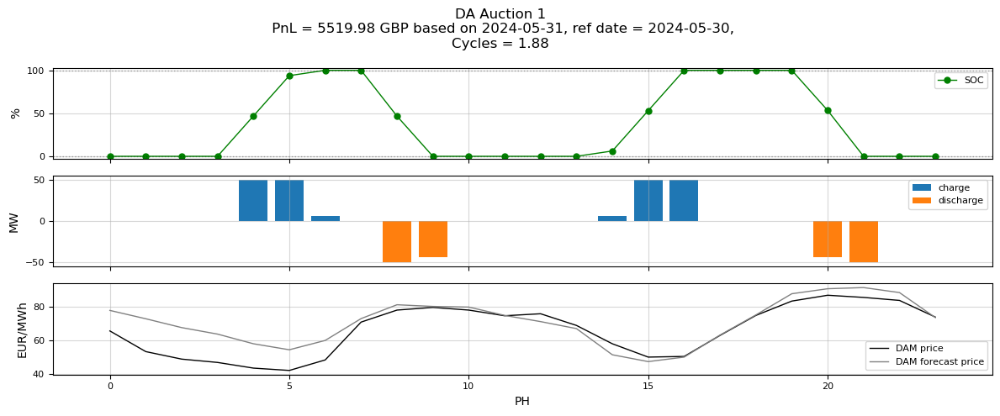

     del_date    ref_date   pnl_da
0  2024-05-31  2024-05-30  5519.98


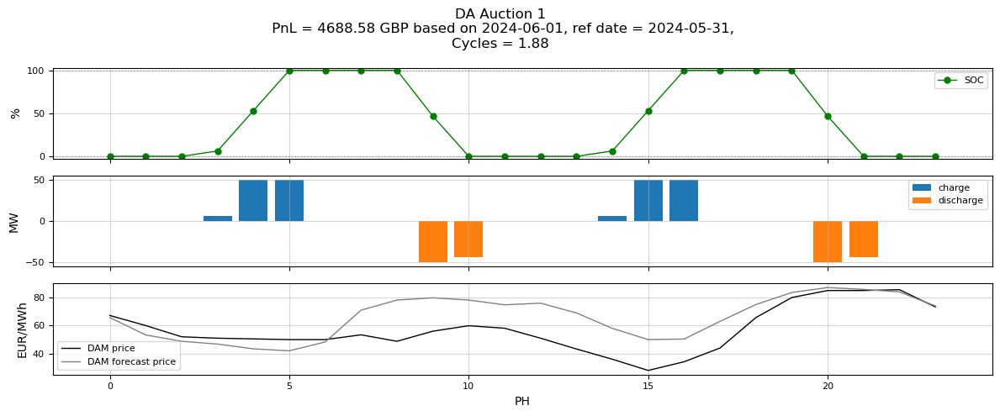

     del_date    ref_date   pnl_da
1  2024-06-01  2024-05-31  4688.58


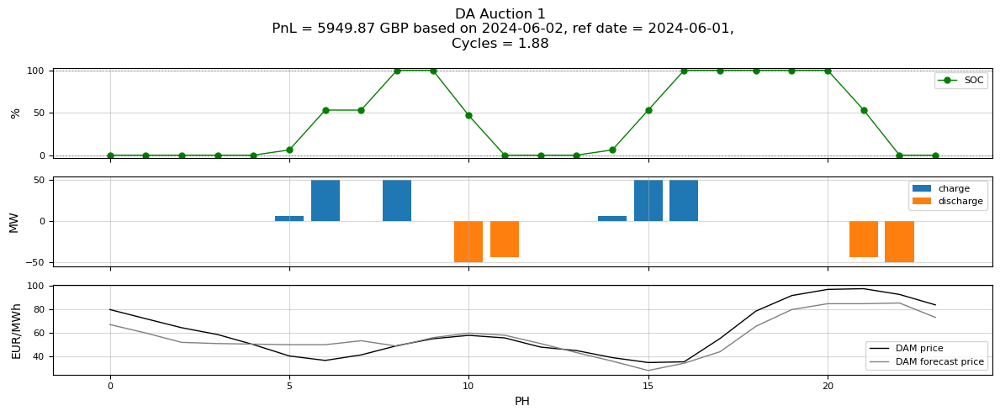

     del_date    ref_date   pnl_da
2  2024-06-02  2024-06-01  5949.87


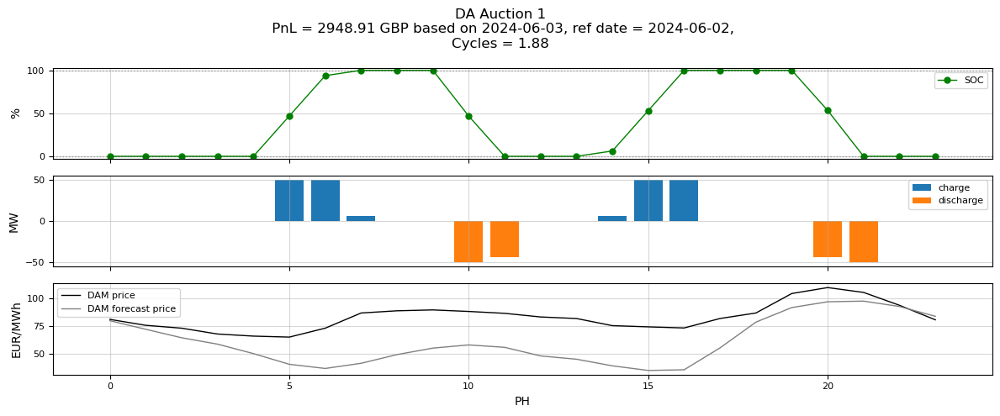

     del_date    ref_date   pnl_da
3  2024-06-03  2024-06-02  2948.91


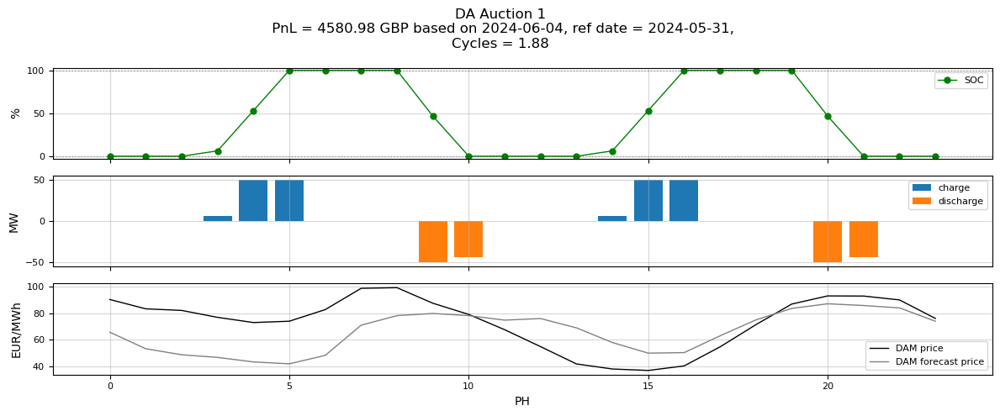

     del_date    ref_date   pnl_da
4  2024-06-04  2024-05-31  4580.98


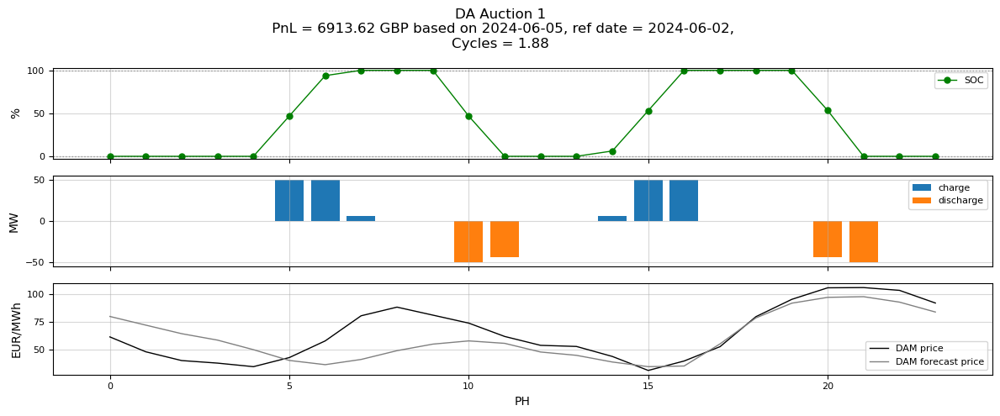

     del_date    ref_date   pnl_da
5  2024-06-05  2024-06-02  6913.62


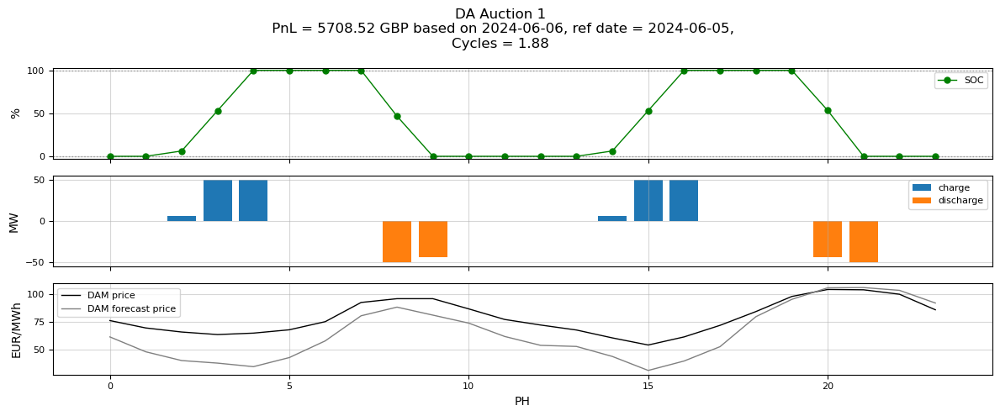

     del_date    ref_date   pnl_da
6  2024-06-06  2024-06-05  5708.52


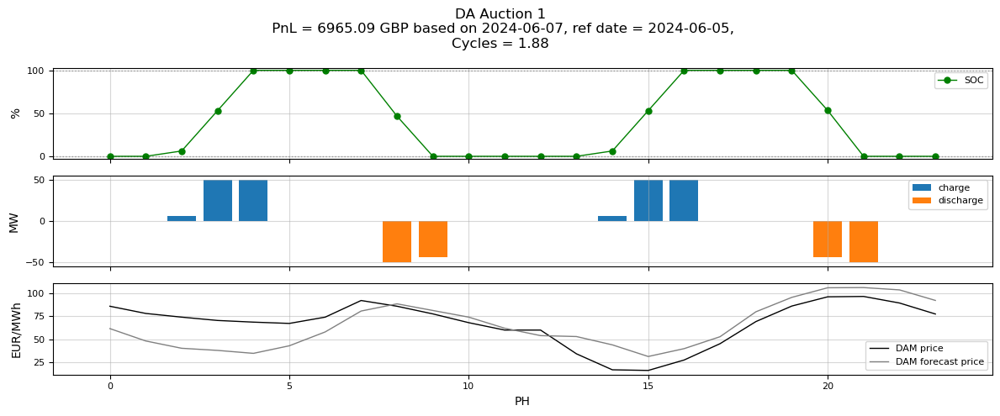

     del_date    ref_date   pnl_da
7  2024-06-07  2024-06-05  6965.09


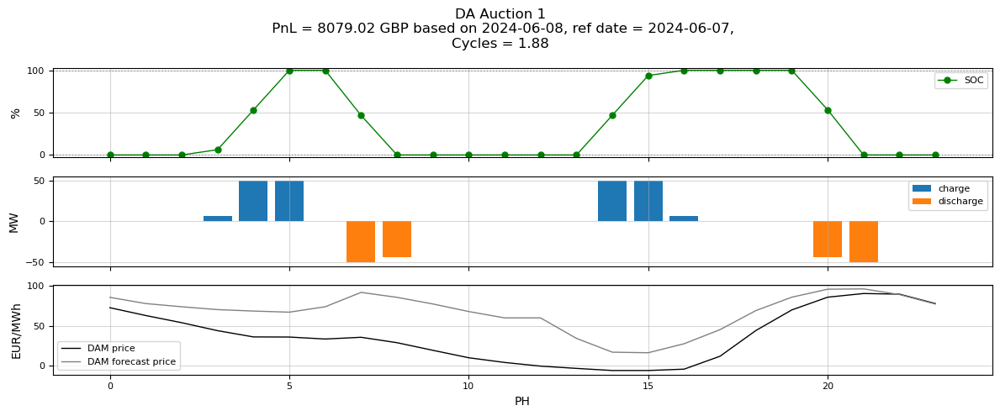

     del_date    ref_date   pnl_da
8  2024-06-08  2024-06-07  8079.02


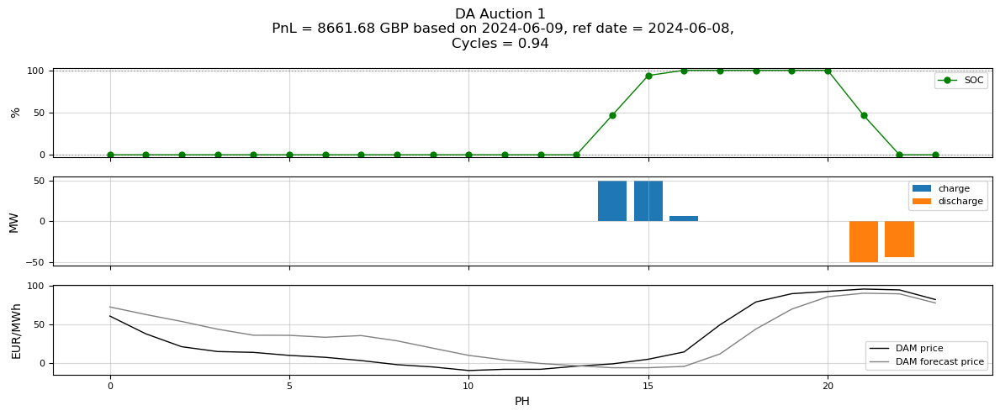

     del_date    ref_date   pnl_da
9  2024-06-09  2024-06-08  8661.68


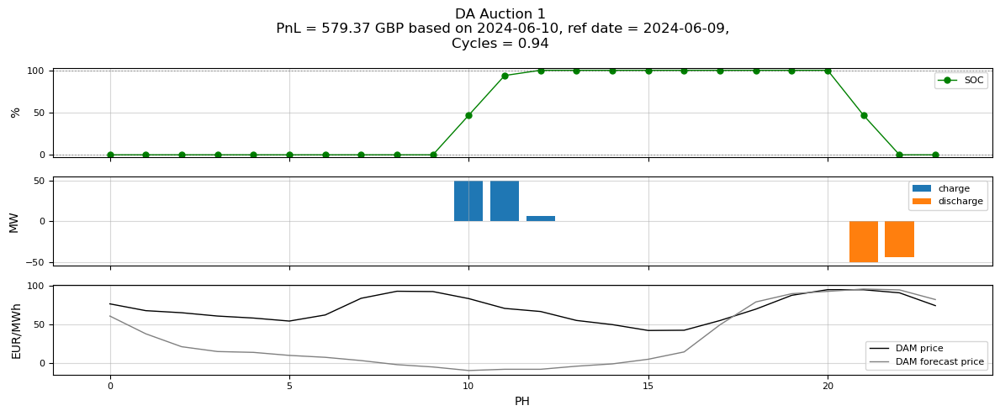

      del_date    ref_date  pnl_da
10  2024-06-10  2024-06-09  579.37


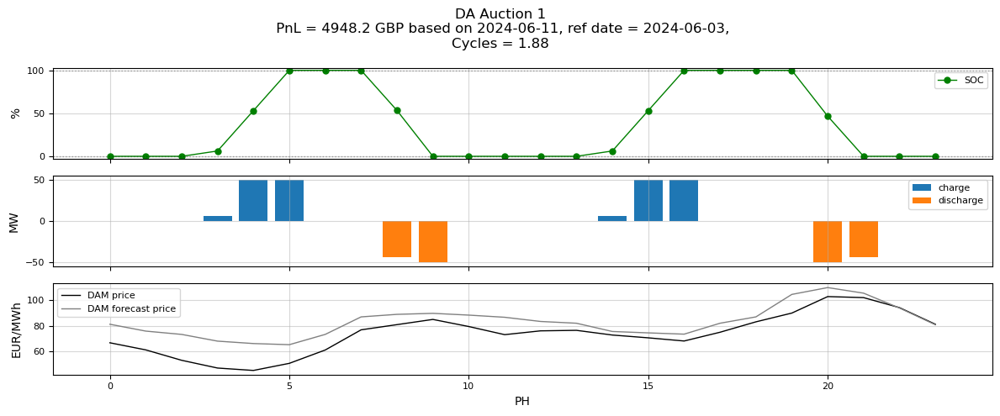

      del_date    ref_date  pnl_da
11  2024-06-11  2024-06-03  4948.2


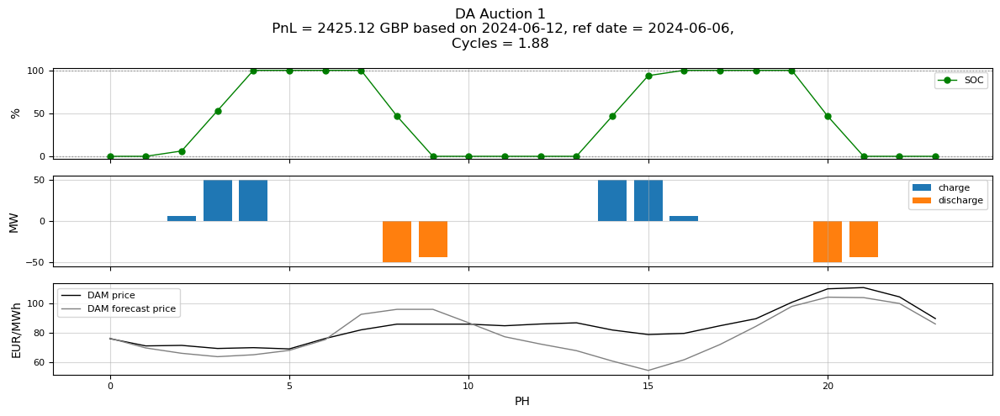

      del_date    ref_date   pnl_da
12  2024-06-12  2024-06-06  2425.12


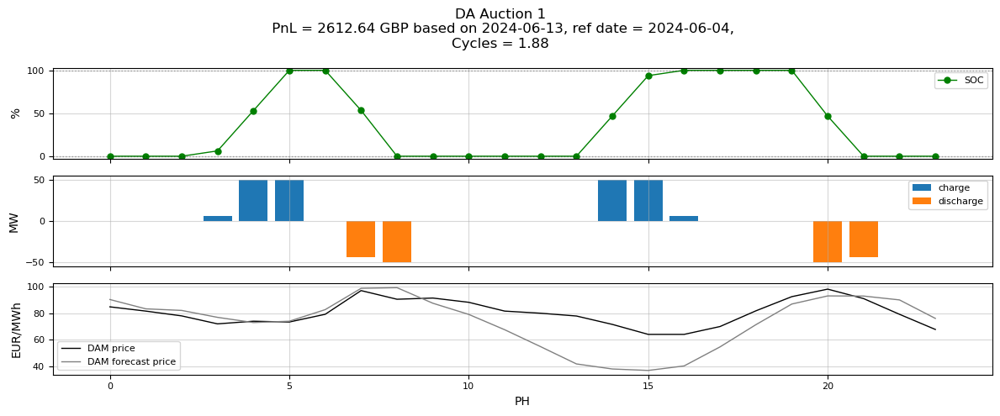

      del_date    ref_date   pnl_da
13  2024-06-13  2024-06-04  2612.64


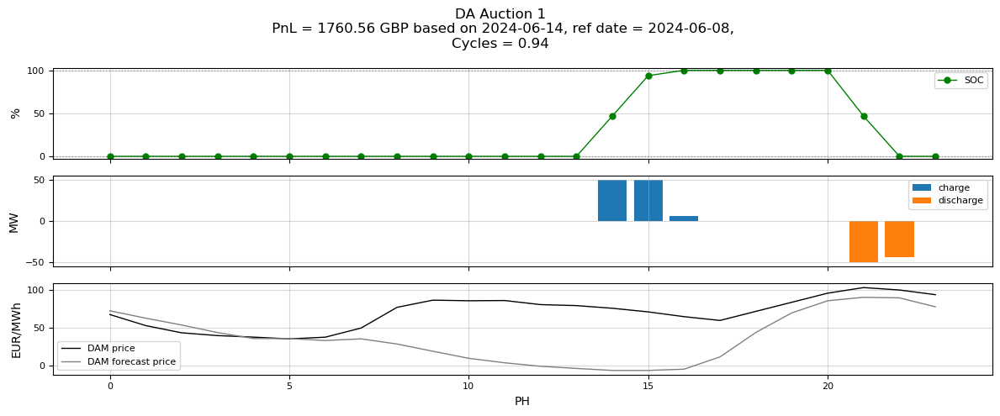

      del_date    ref_date   pnl_da
14  2024-06-14  2024-06-08  1760.56


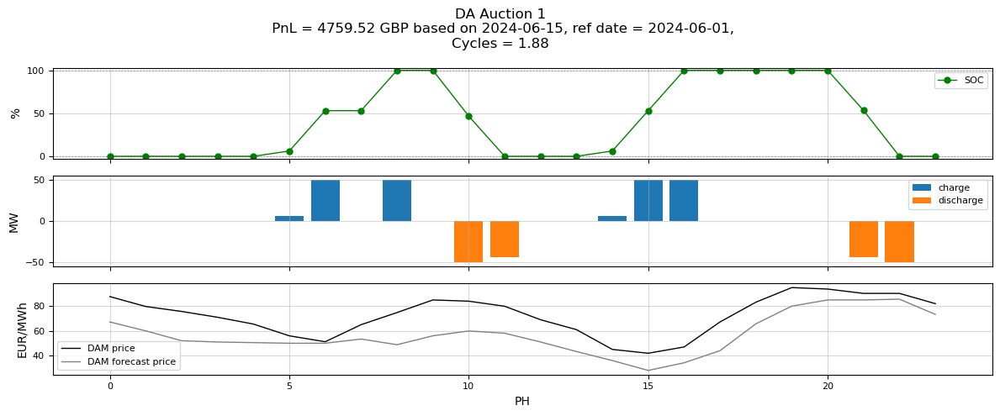

      del_date    ref_date   pnl_da
15  2024-06-15  2024-06-01  4759.52


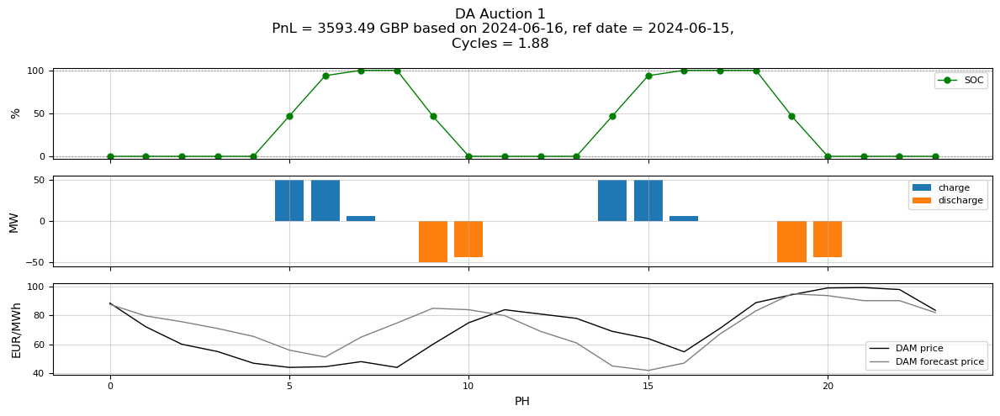

      del_date    ref_date   pnl_da
16  2024-06-16  2024-06-15  3593.49


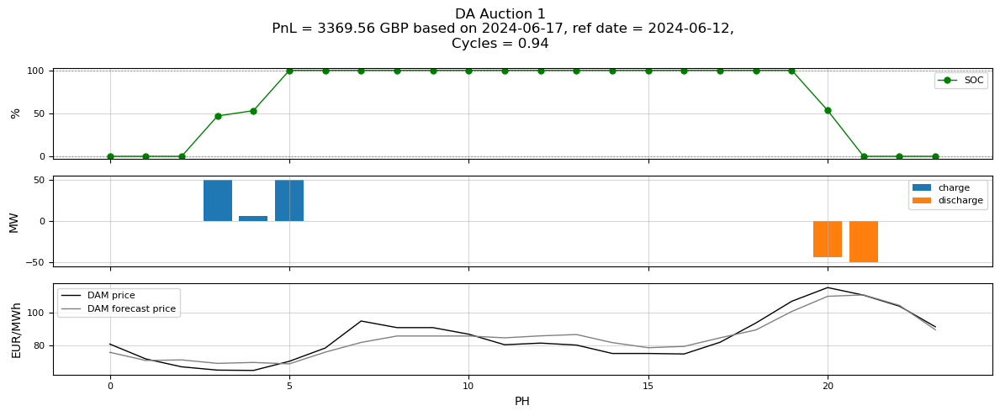

      del_date    ref_date   pnl_da
17  2024-06-17  2024-06-12  3369.56


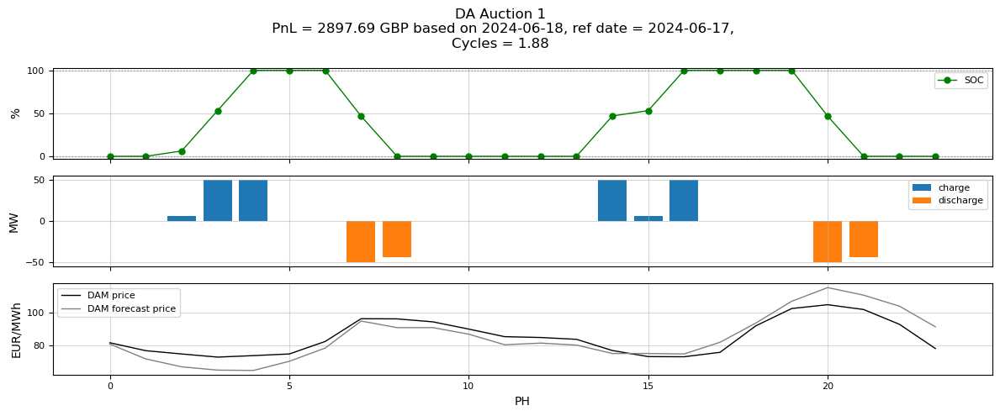

      del_date    ref_date   pnl_da
18  2024-06-18  2024-06-17  2897.69


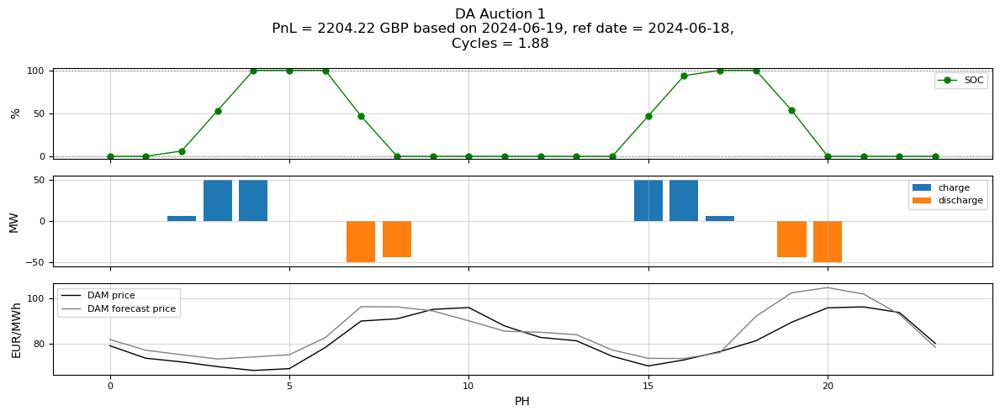

      del_date    ref_date   pnl_da
19  2024-06-19  2024-06-18  2204.22


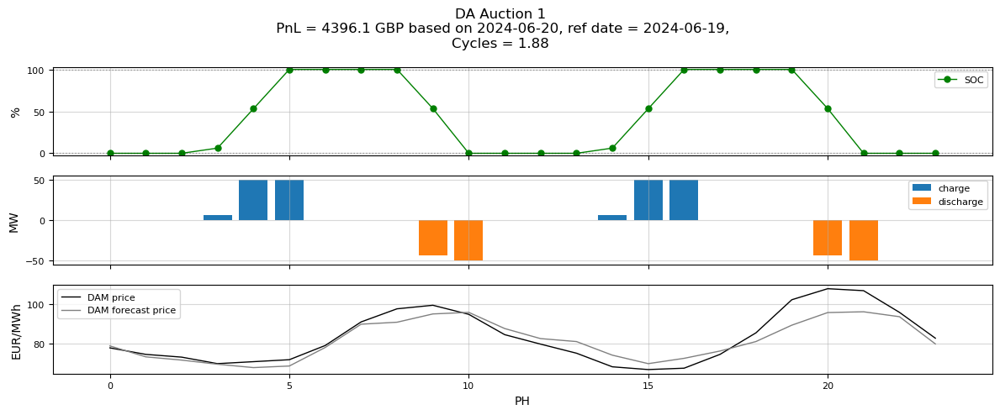

      del_date    ref_date  pnl_da
20  2024-06-20  2024-06-19  4396.1


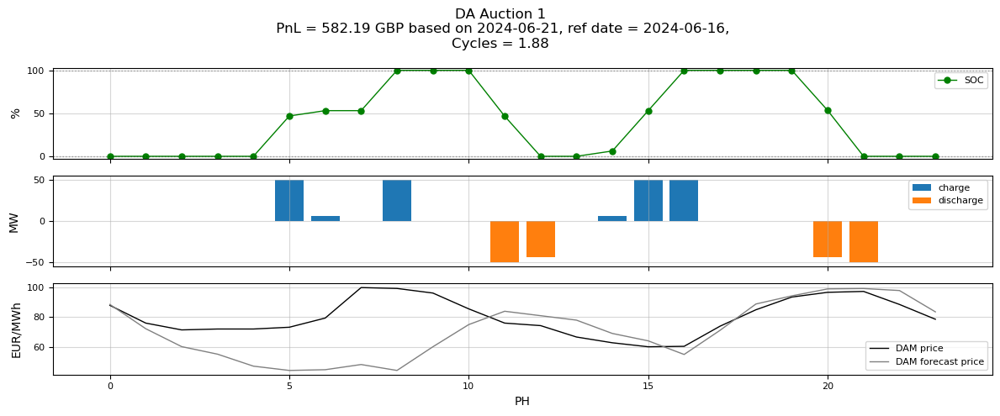

      del_date    ref_date  pnl_da
21  2024-06-21  2024-06-16  582.19


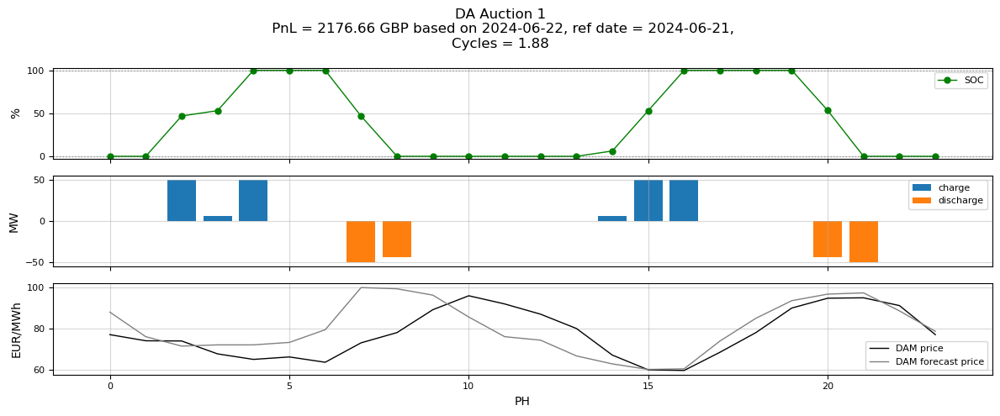

      del_date    ref_date   pnl_da
22  2024-06-22  2024-06-21  2176.66


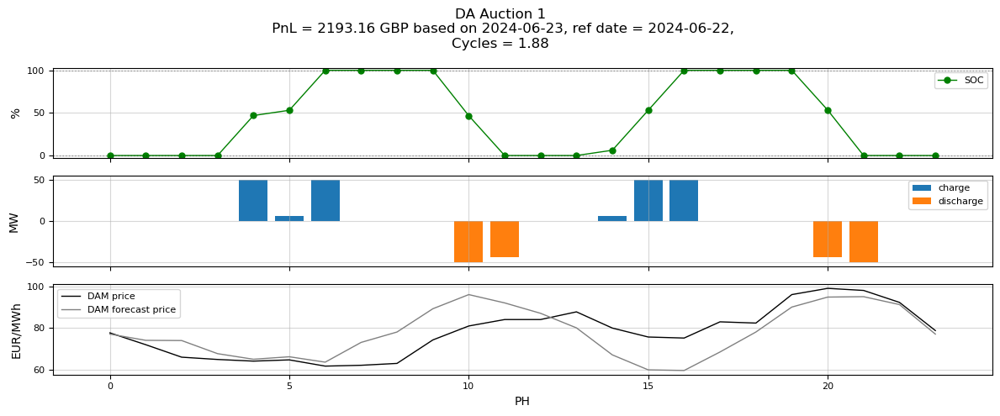

      del_date    ref_date   pnl_da
23  2024-06-23  2024-06-22  2193.16


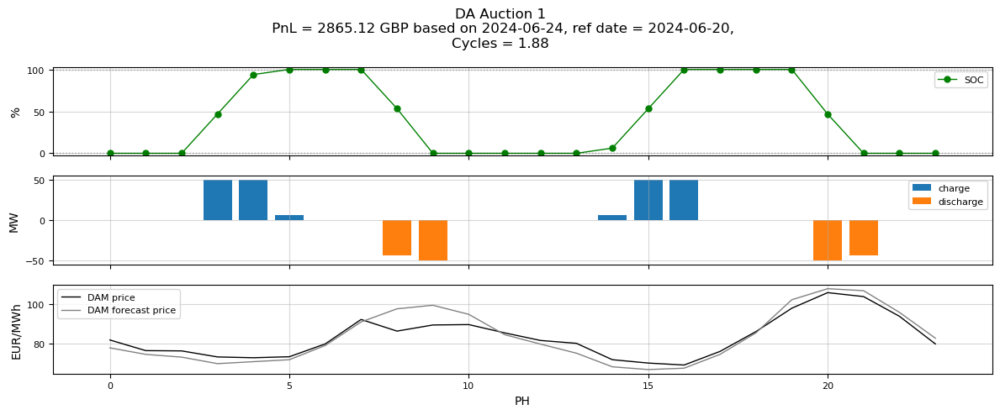

      del_date    ref_date   pnl_da
24  2024-06-24  2024-06-20  2865.12


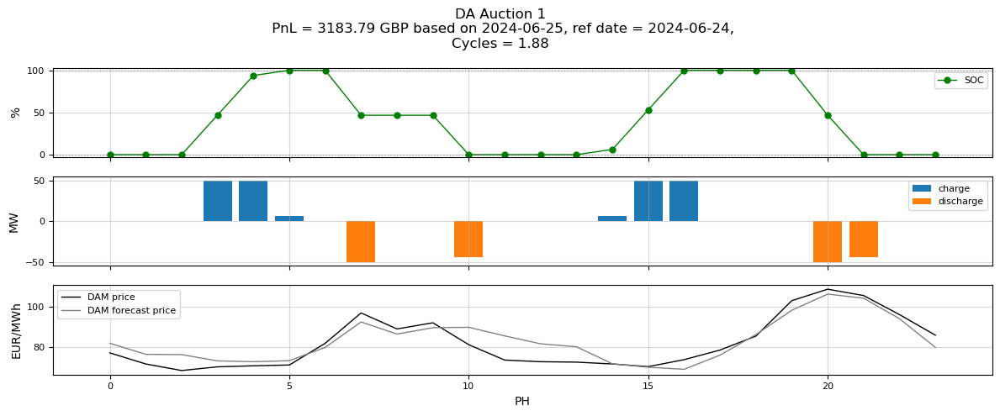

      del_date    ref_date   pnl_da
25  2024-06-25  2024-06-24  3183.79


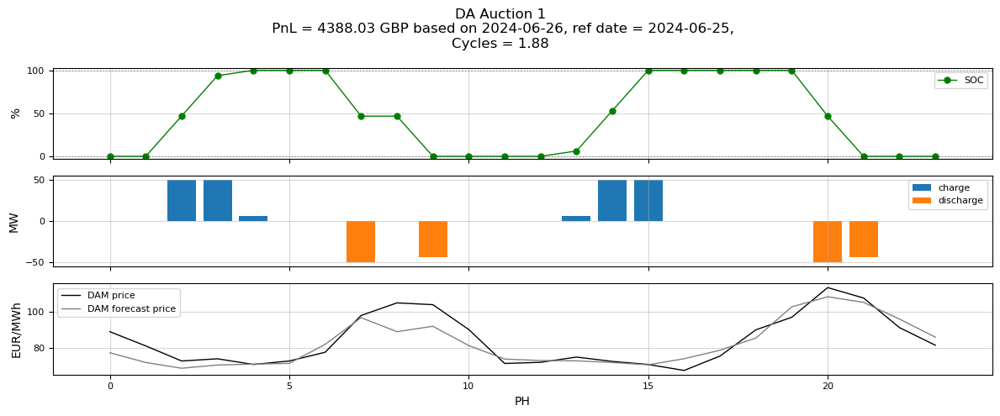

      del_date    ref_date   pnl_da
26  2024-06-26  2024-06-25  4388.03


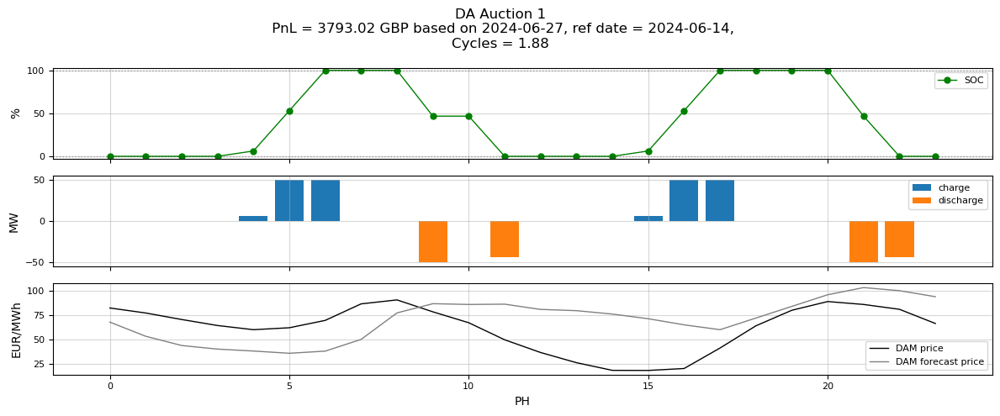

      del_date    ref_date   pnl_da
27  2024-06-27  2024-06-14  3793.02


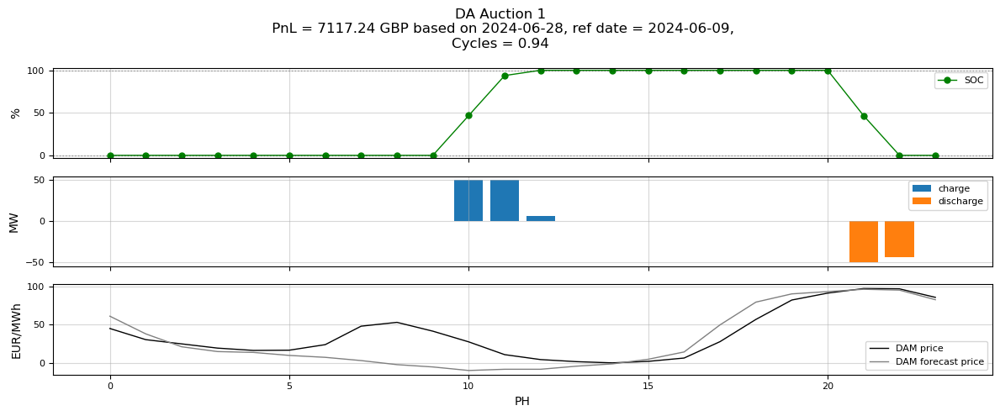

      del_date    ref_date   pnl_da
28  2024-06-28  2024-06-09  7117.24


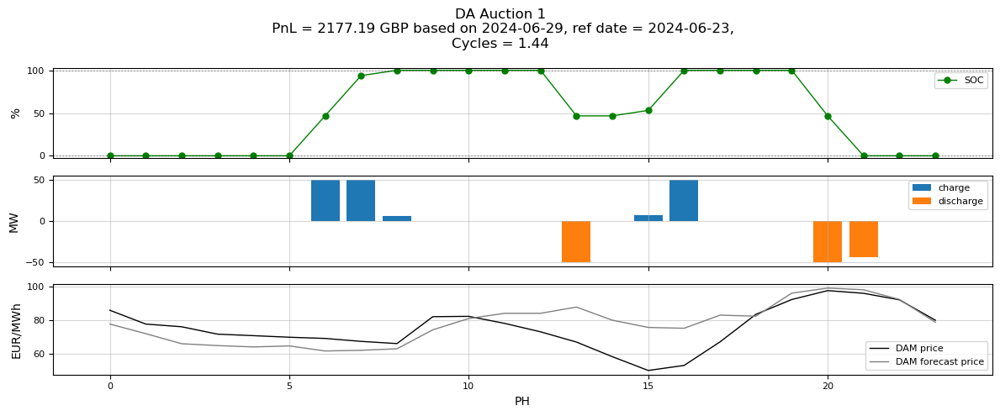

      del_date    ref_date   pnl_da
29  2024-06-29  2024-06-23  2177.19


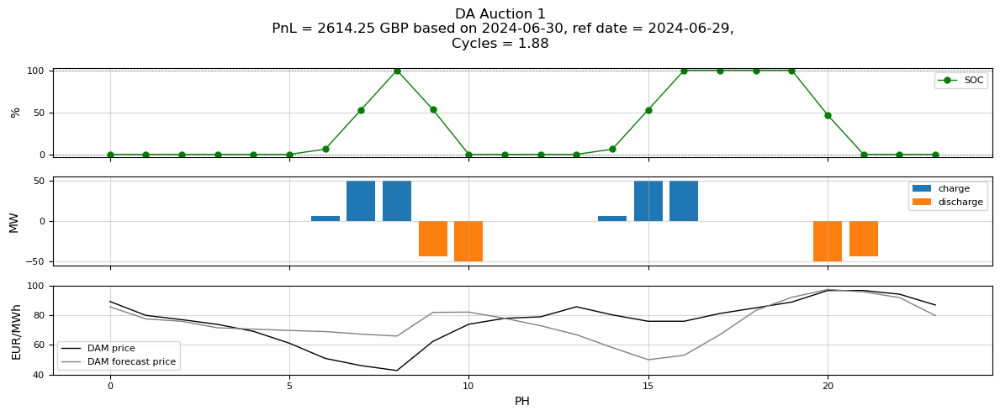

      del_date    ref_date   pnl_da
30  2024-06-30  2024-06-29  2614.25


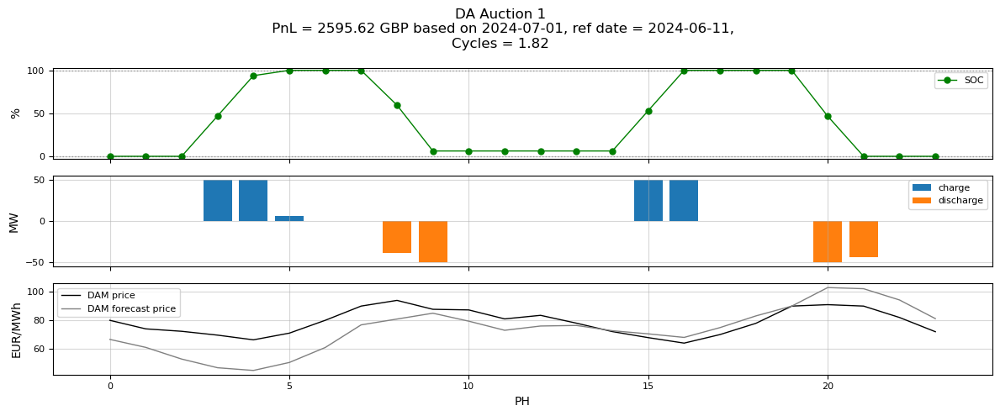

      del_date    ref_date   pnl_da
31  2024-07-01  2024-06-11  2595.62


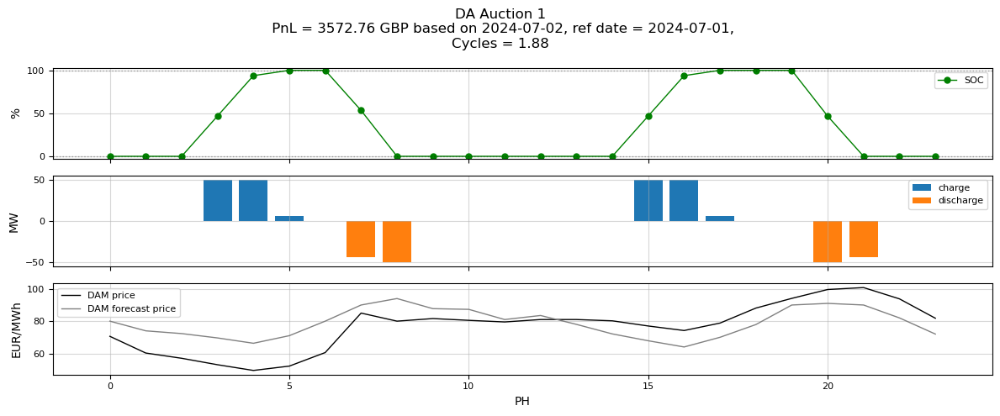

      del_date    ref_date   pnl_da
32  2024-07-02  2024-07-01  3572.76


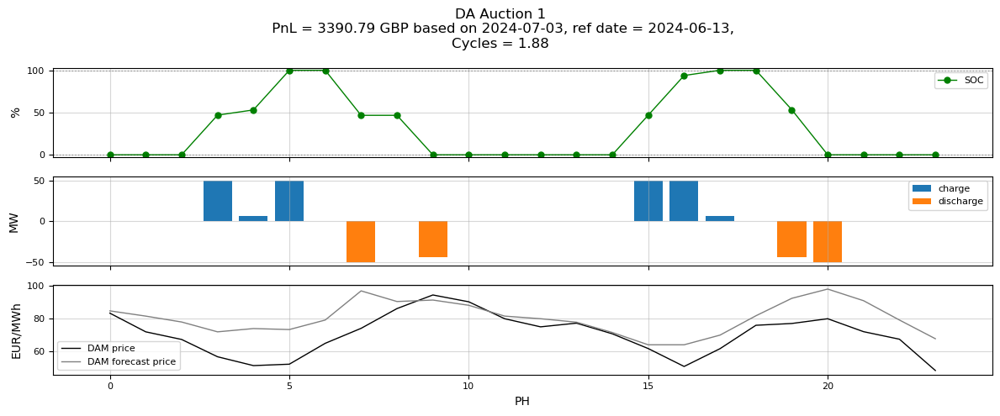

      del_date    ref_date   pnl_da
33  2024-07-03  2024-06-13  3390.79


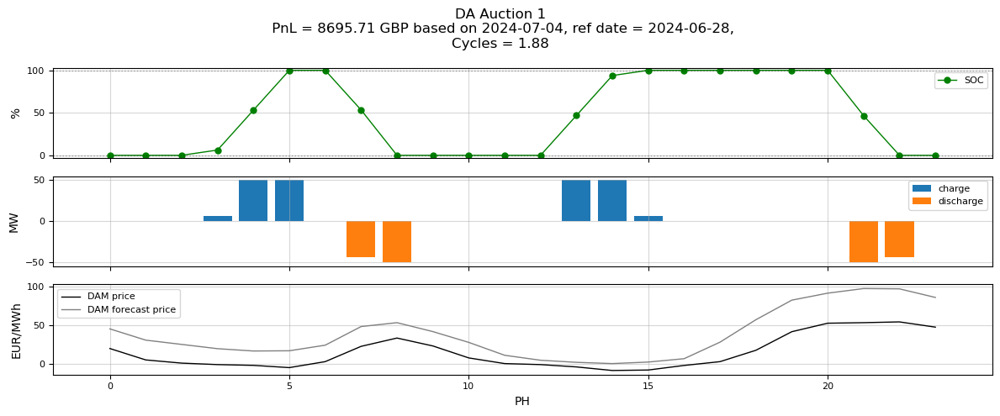

      del_date    ref_date   pnl_da
34  2024-07-04  2024-06-28  8695.71


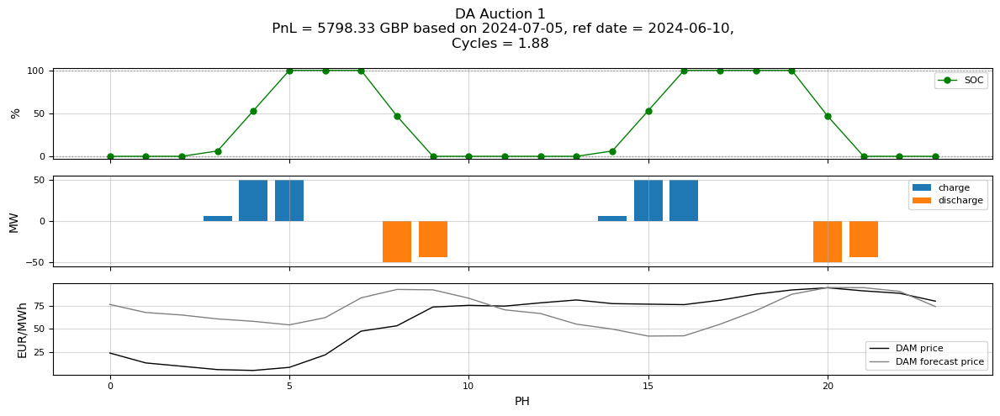

      del_date    ref_date   pnl_da
35  2024-07-05  2024-06-10  5798.33


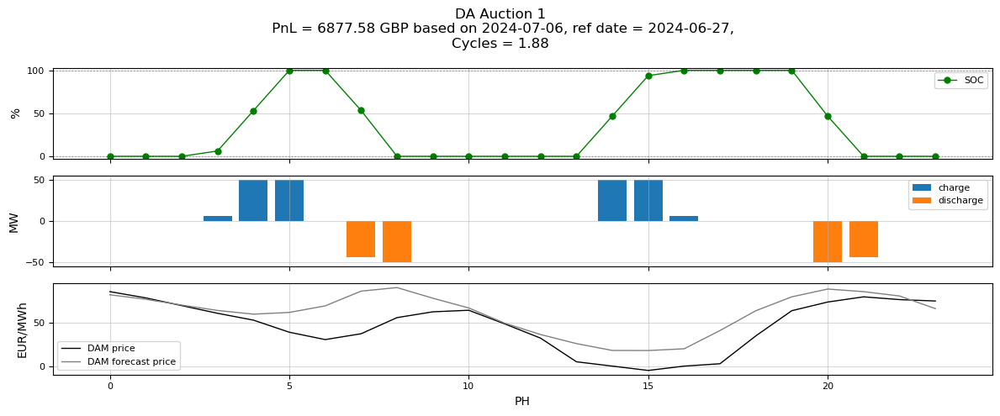

      del_date    ref_date   pnl_da
36  2024-07-06  2024-06-27  6877.58


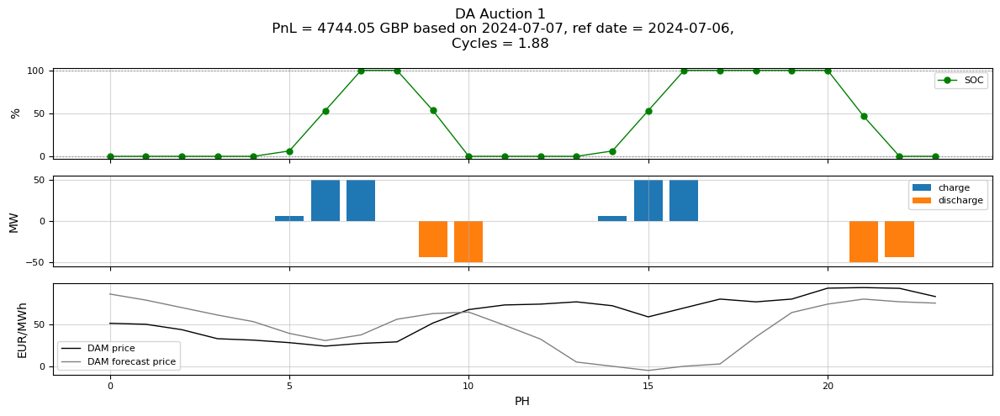

      del_date    ref_date   pnl_da
37  2024-07-07  2024-07-06  4744.05


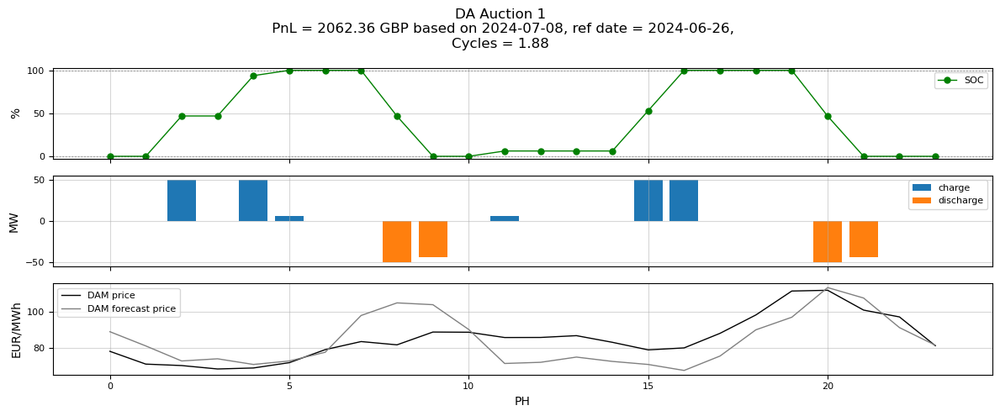

      del_date    ref_date   pnl_da
38  2024-07-08  2024-06-26  2062.36


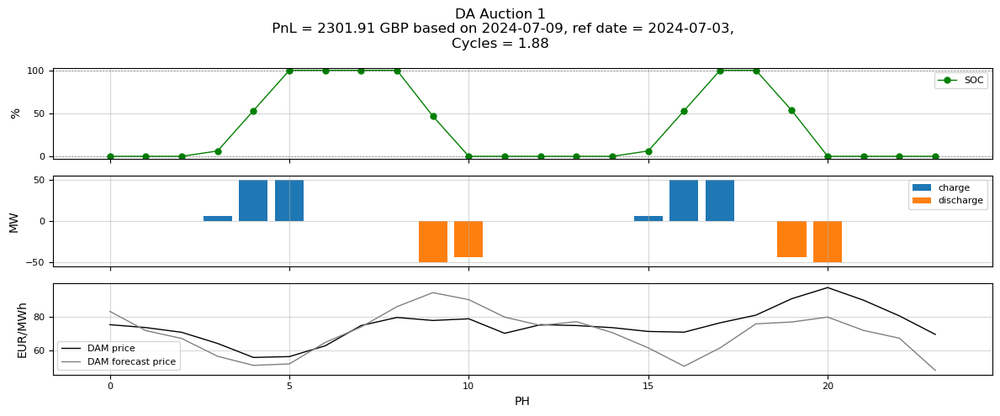

      del_date    ref_date   pnl_da
39  2024-07-09  2024-07-03  2301.91


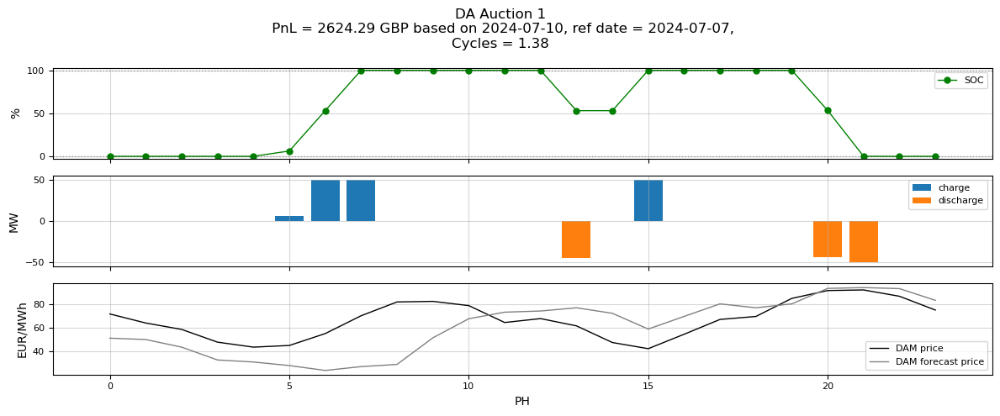

      del_date    ref_date   pnl_da
40  2024-07-10  2024-07-07  2624.29


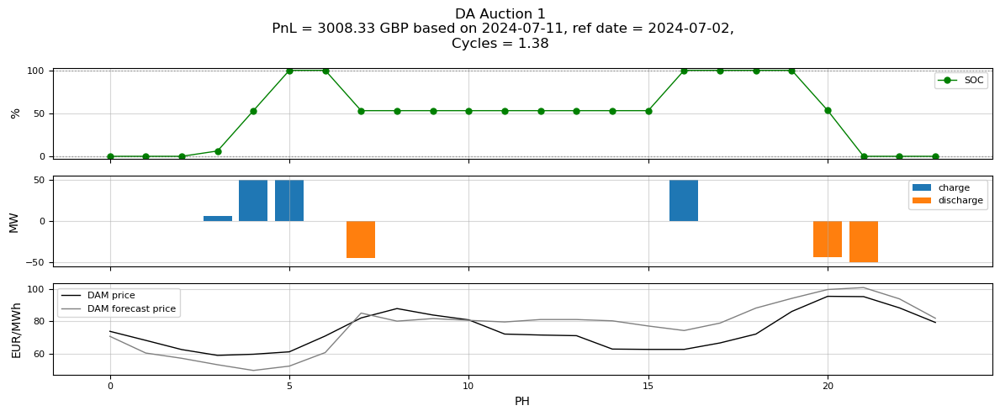

      del_date    ref_date   pnl_da
41  2024-07-11  2024-07-02  3008.33


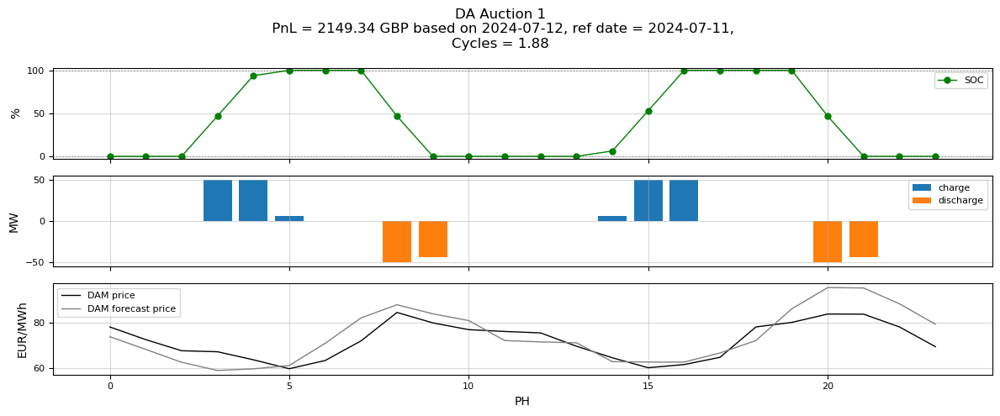

      del_date    ref_date   pnl_da
42  2024-07-12  2024-07-11  2149.34


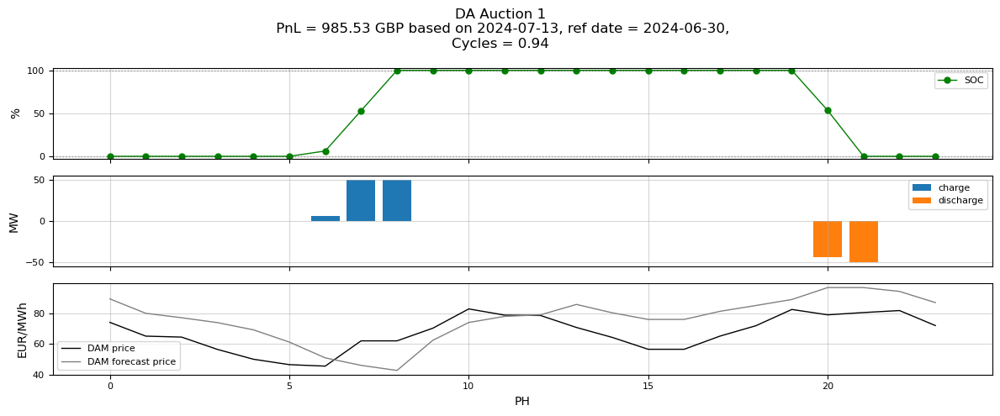

      del_date    ref_date  pnl_da
43  2024-07-13  2024-06-30  985.53


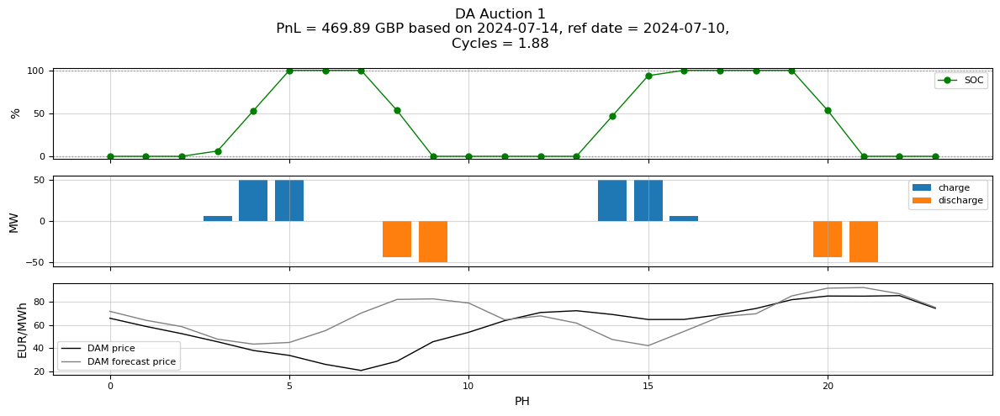

      del_date    ref_date  pnl_da
44  2024-07-14  2024-07-10  469.89


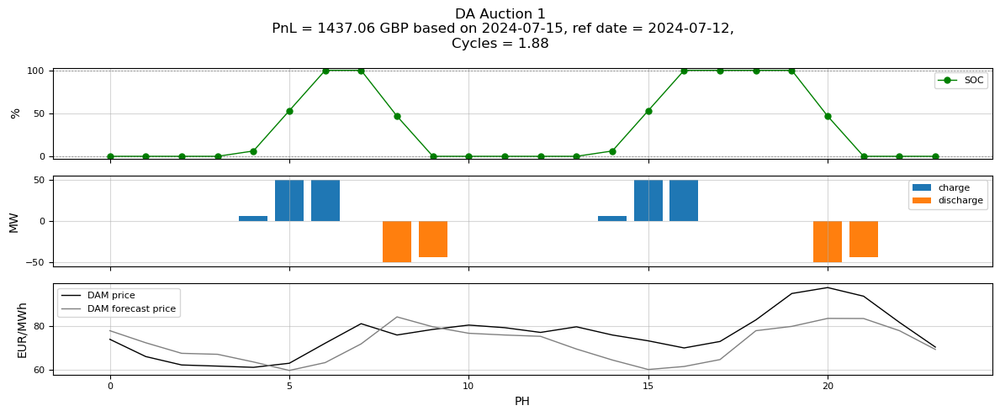

      del_date    ref_date   pnl_da
45  2024-07-15  2024-07-12  1437.06


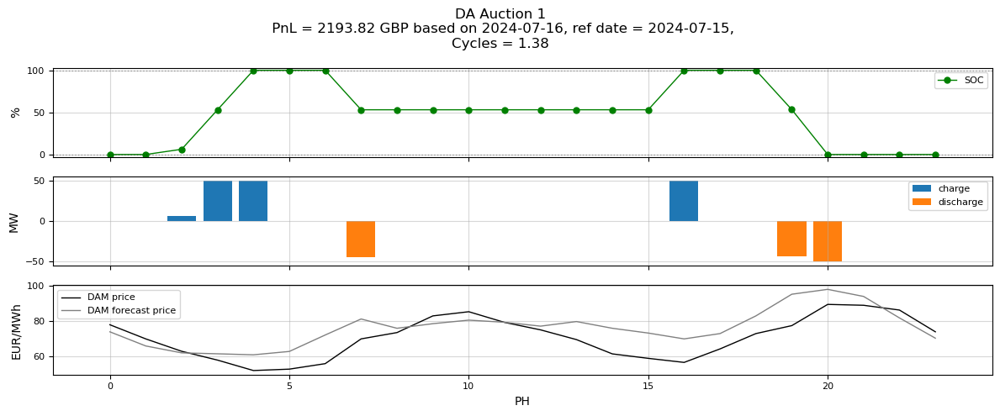

      del_date    ref_date   pnl_da
46  2024-07-16  2024-07-15  2193.82


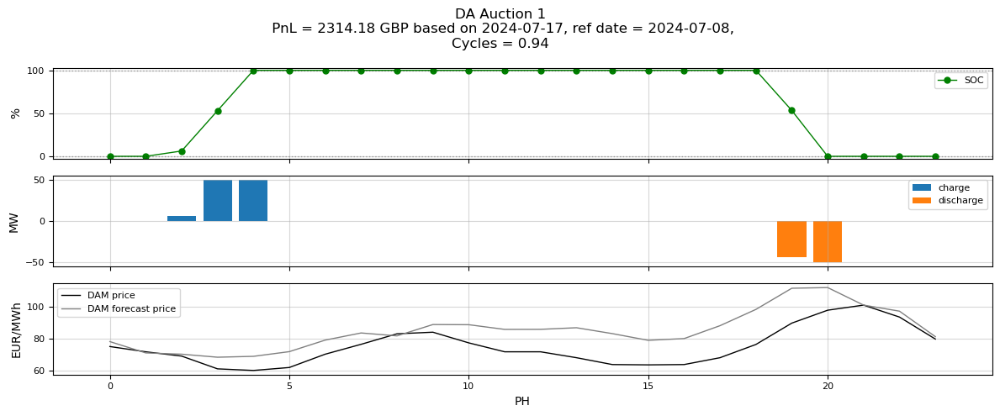

      del_date    ref_date   pnl_da
47  2024-07-17  2024-07-08  2314.18


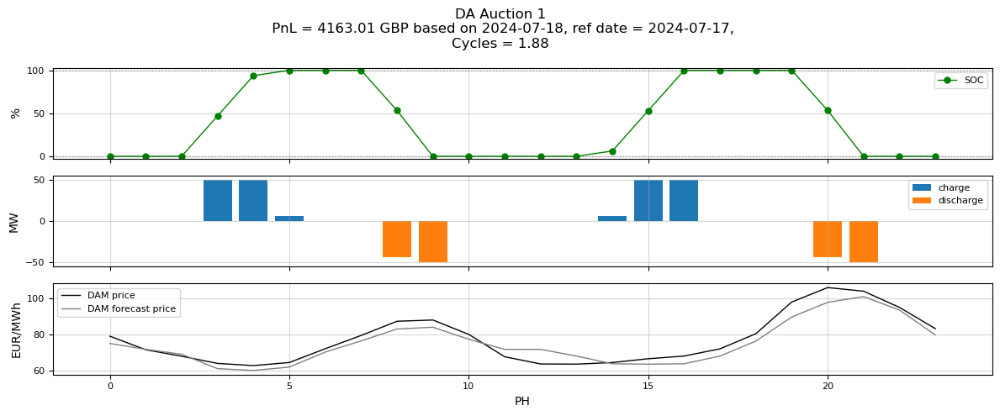

      del_date    ref_date   pnl_da
48  2024-07-18  2024-07-17  4163.01


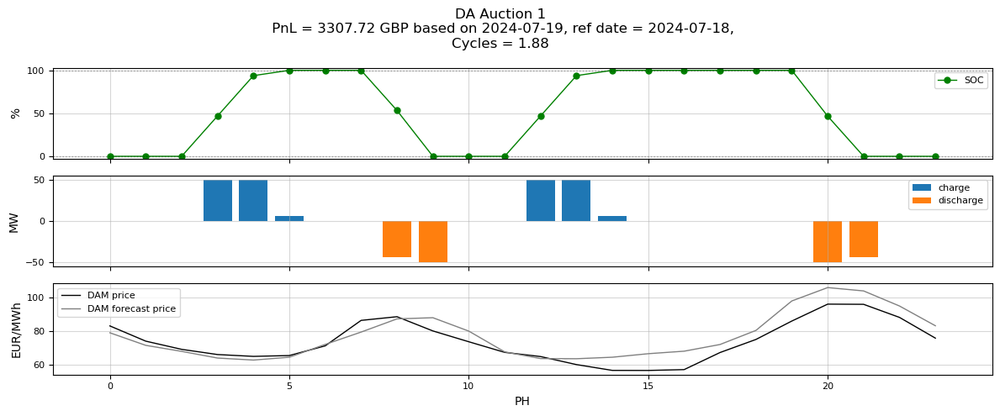

      del_date    ref_date   pnl_da
49  2024-07-19  2024-07-18  3307.72


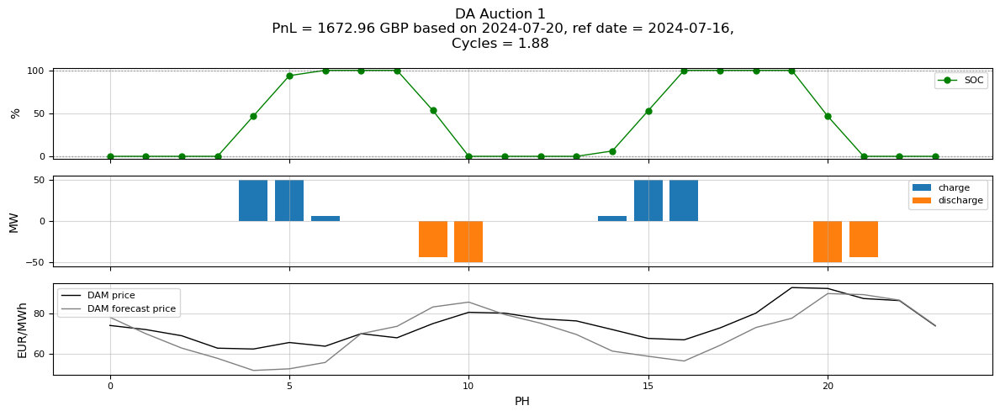

      del_date    ref_date   pnl_da
50  2024-07-20  2024-07-16  1672.96


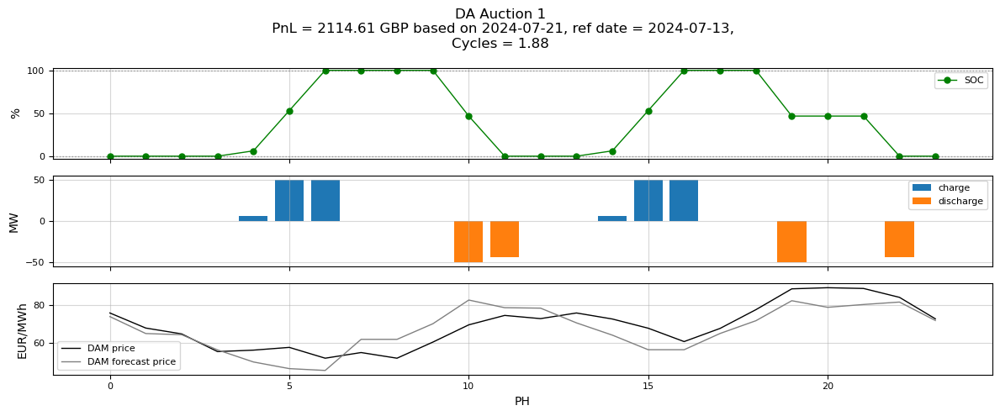

      del_date    ref_date   pnl_da
51  2024-07-21  2024-07-13  2114.61


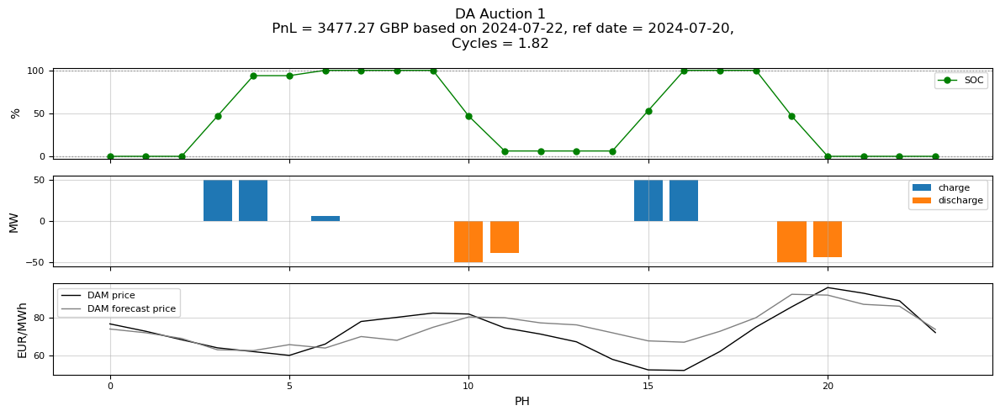

      del_date    ref_date   pnl_da
52  2024-07-22  2024-07-20  3477.27


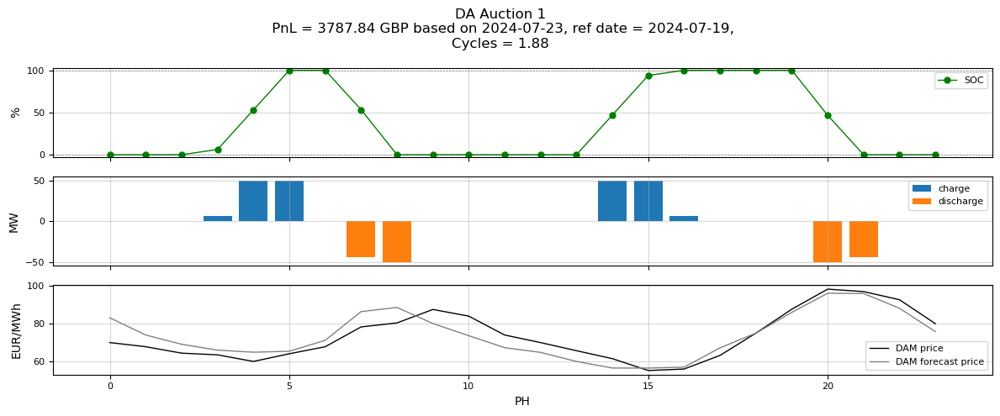

      del_date    ref_date   pnl_da
53  2024-07-23  2024-07-19  3787.84


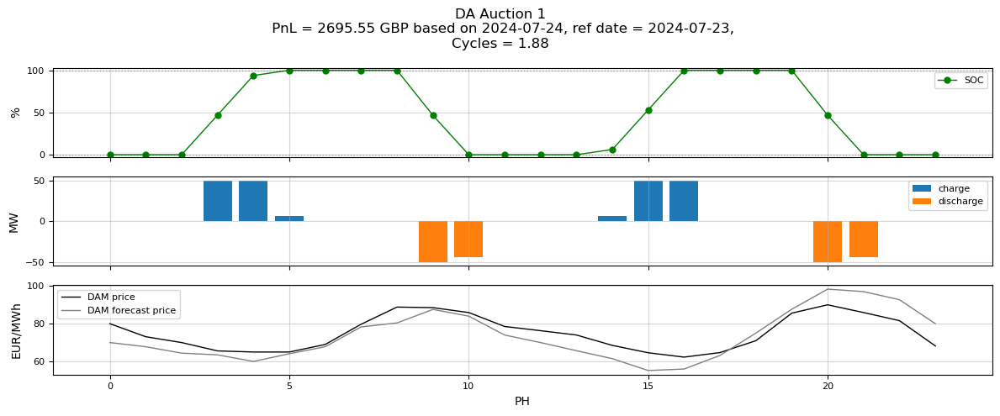

      del_date    ref_date   pnl_da
54  2024-07-24  2024-07-23  2695.55


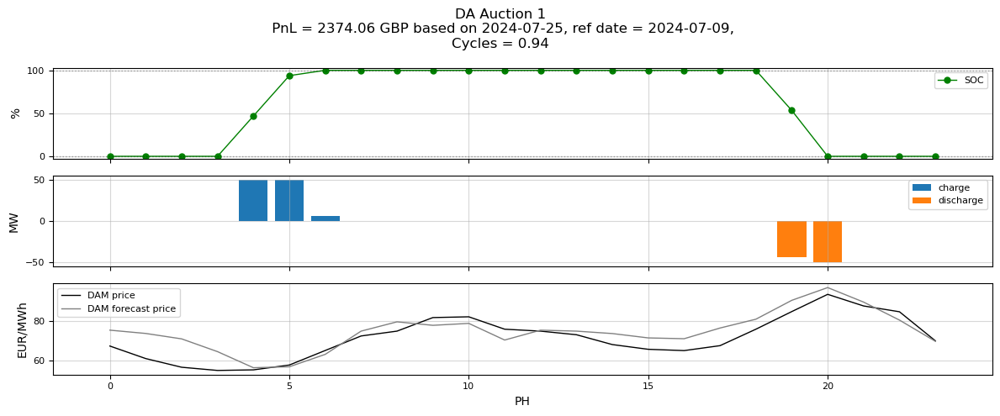

      del_date    ref_date   pnl_da
55  2024-07-25  2024-07-09  2374.06


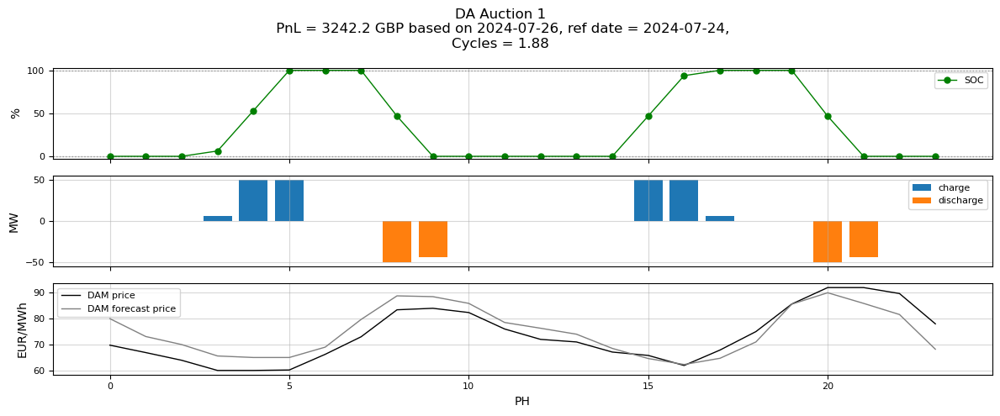

      del_date    ref_date  pnl_da
56  2024-07-26  2024-07-24  3242.2


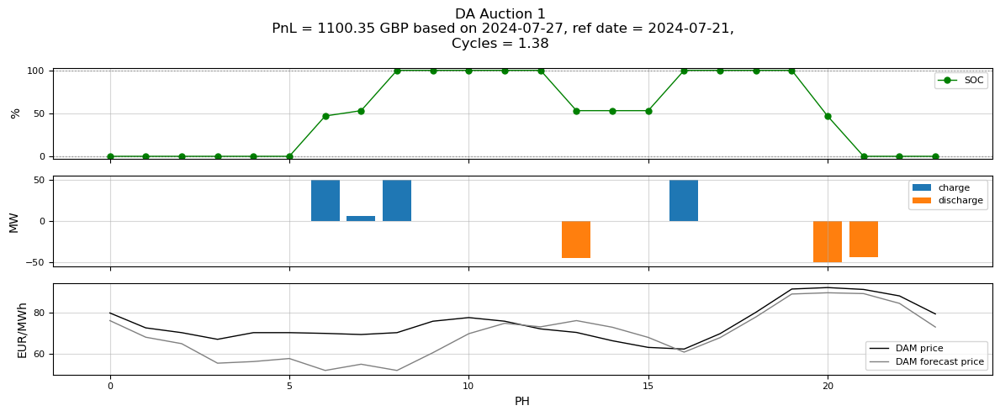

      del_date    ref_date   pnl_da
57  2024-07-27  2024-07-21  1100.35


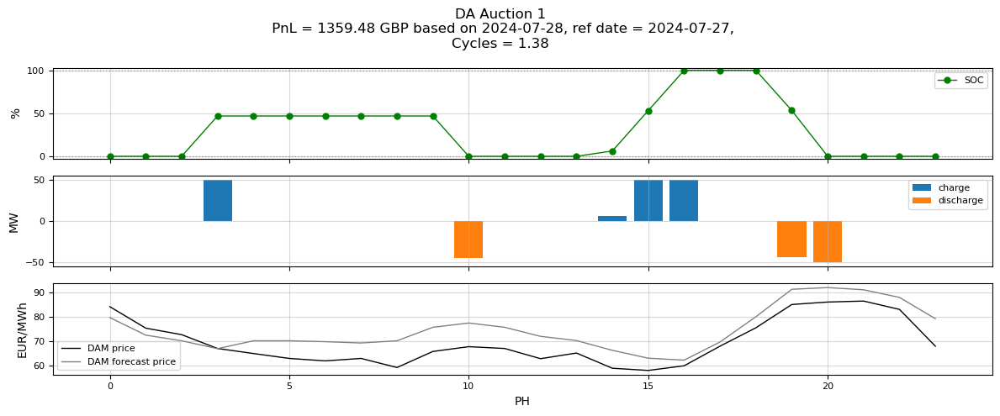

      del_date    ref_date   pnl_da
58  2024-07-28  2024-07-27  1359.48


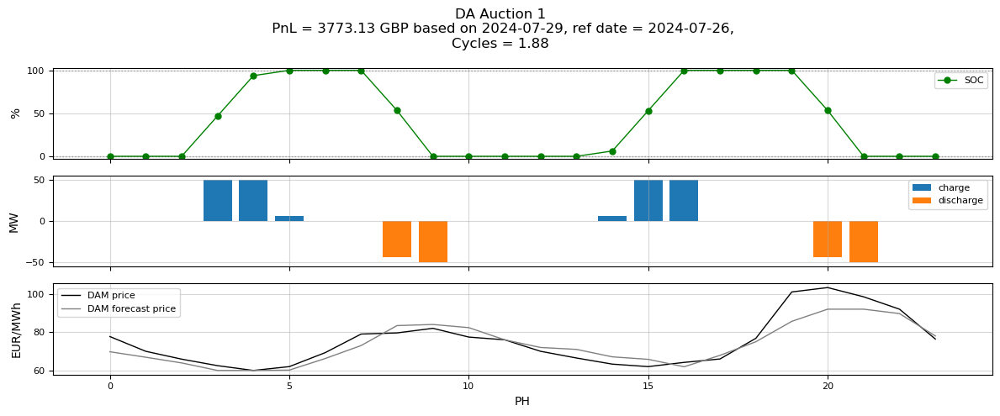

      del_date    ref_date   pnl_da
59  2024-07-29  2024-07-26  3773.13


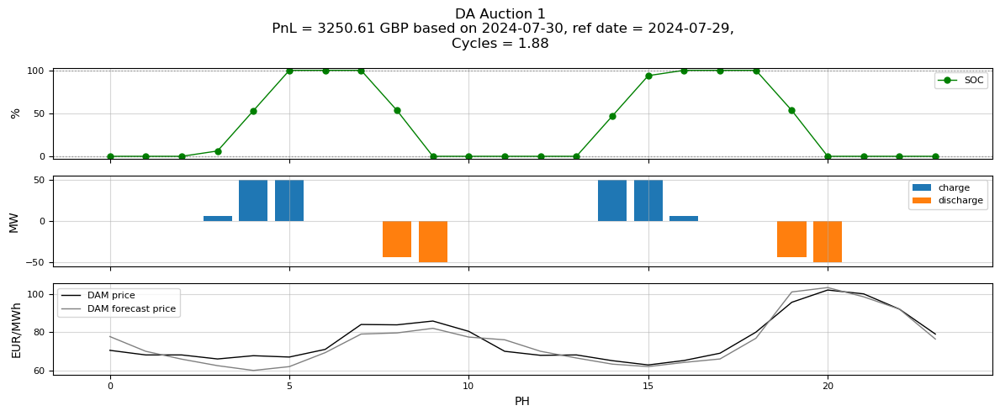

      del_date    ref_date   pnl_da
60  2024-07-30  2024-07-29  3250.61


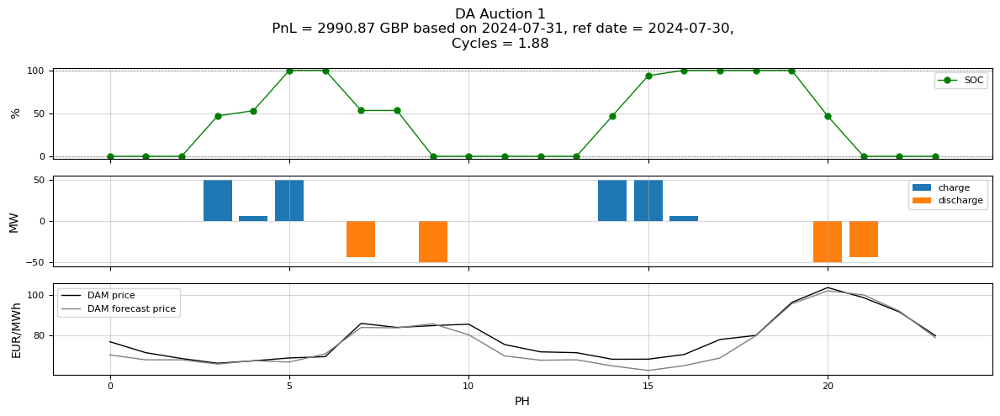

      del_date    ref_date   pnl_da
61  2024-07-31  2024-07-30  2990.87


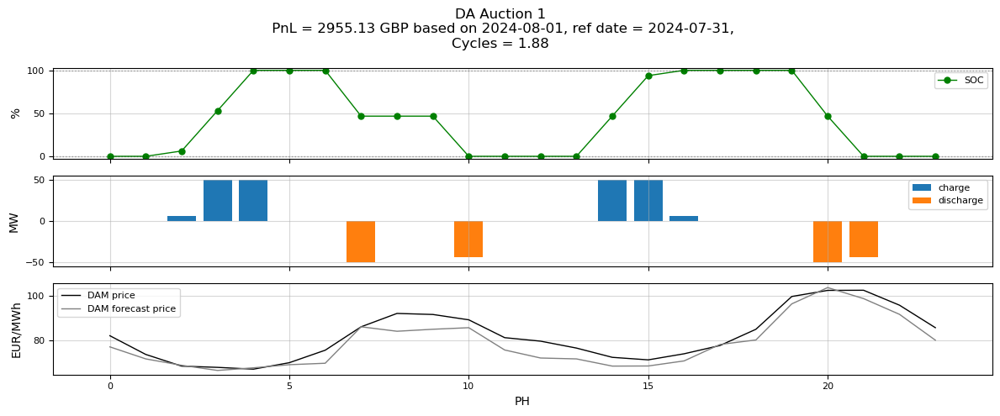

      del_date    ref_date   pnl_da
62  2024-08-01  2024-07-31  2955.13


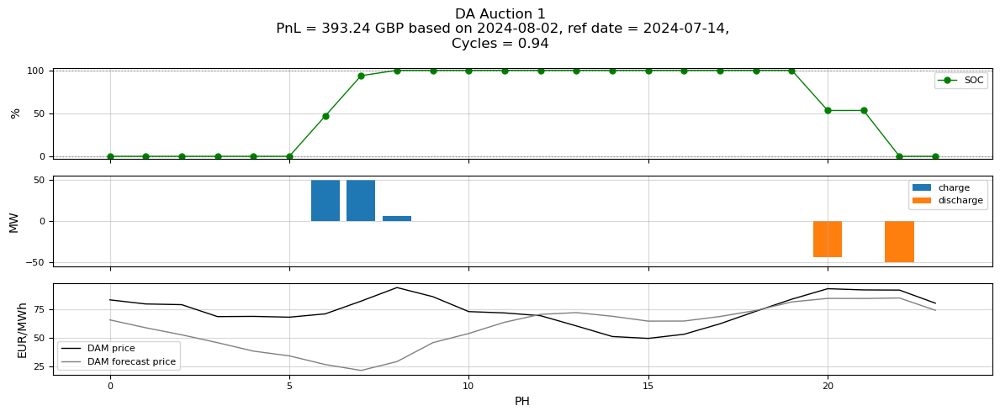

      del_date    ref_date  pnl_da
63  2024-08-02  2024-07-14  393.24


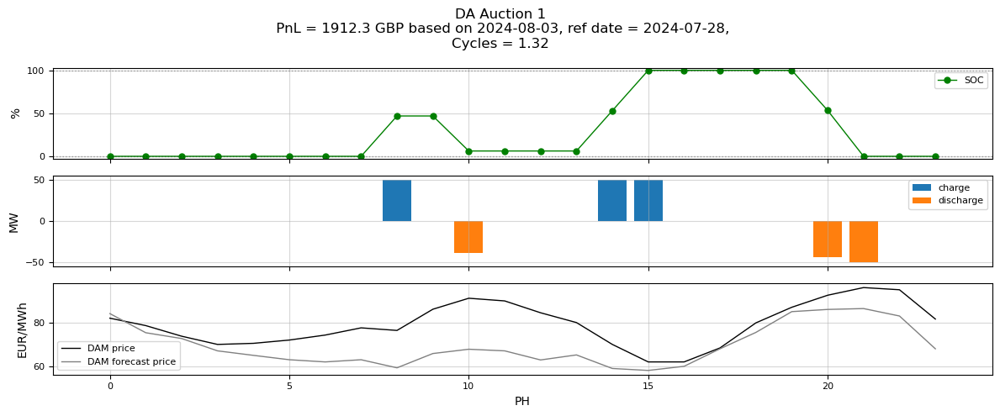

      del_date    ref_date  pnl_da
64  2024-08-03  2024-07-28  1912.3


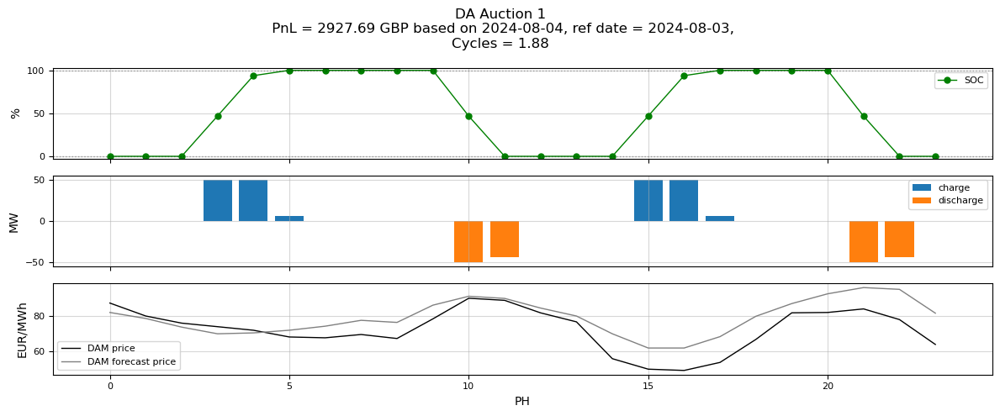

      del_date    ref_date   pnl_da
65  2024-08-04  2024-08-03  2927.69


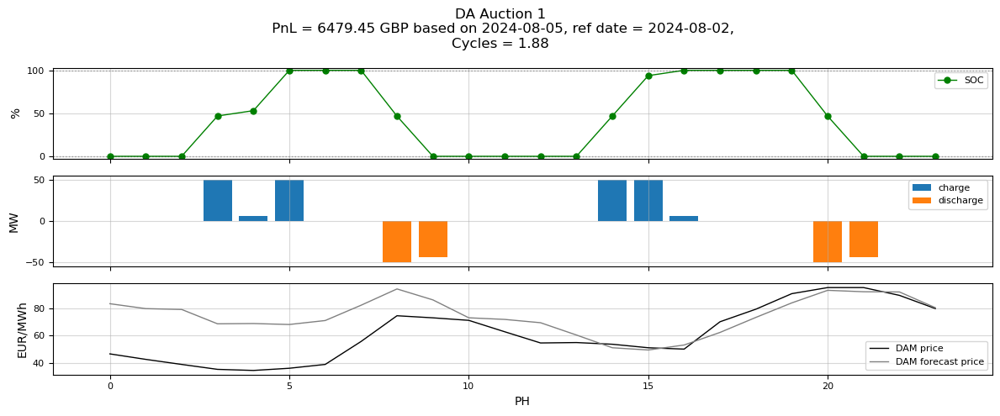

      del_date    ref_date   pnl_da
66  2024-08-05  2024-08-02  6479.45


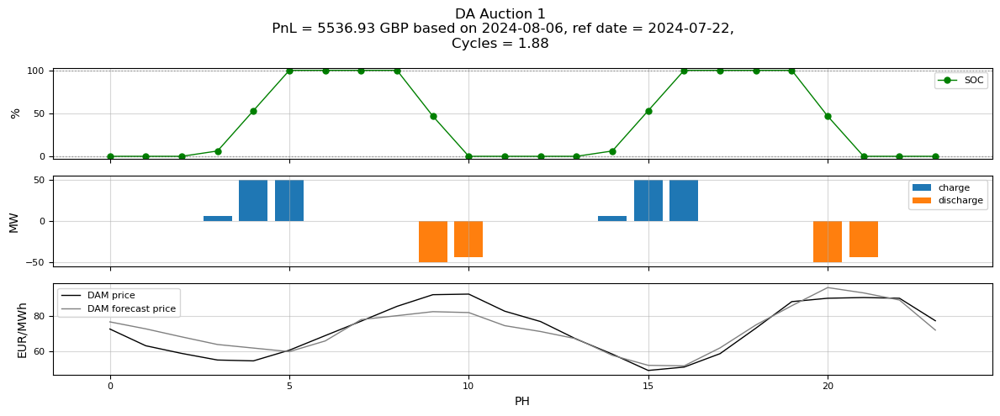

      del_date    ref_date   pnl_da
67  2024-08-06  2024-07-22  5536.93


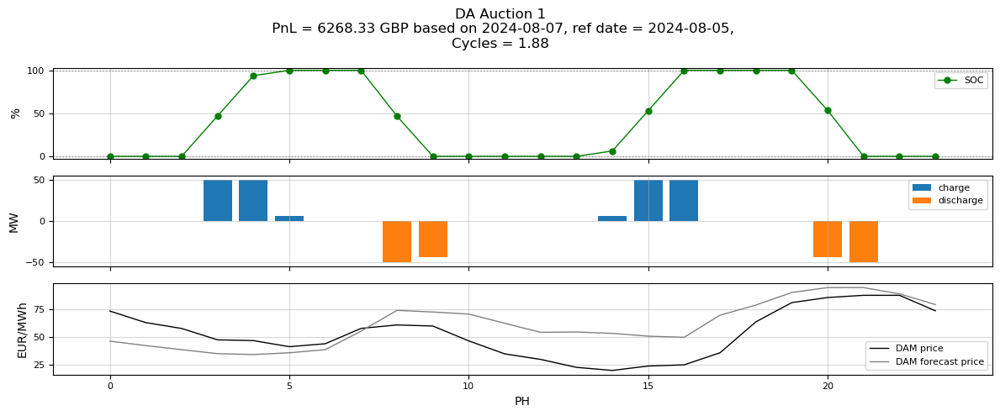

      del_date    ref_date   pnl_da
68  2024-08-07  2024-08-05  6268.33


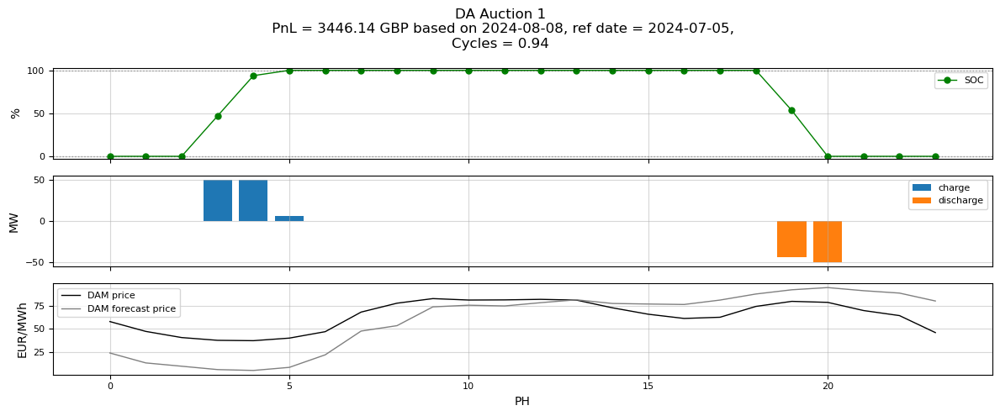

      del_date    ref_date   pnl_da
69  2024-08-08  2024-07-05  3446.14


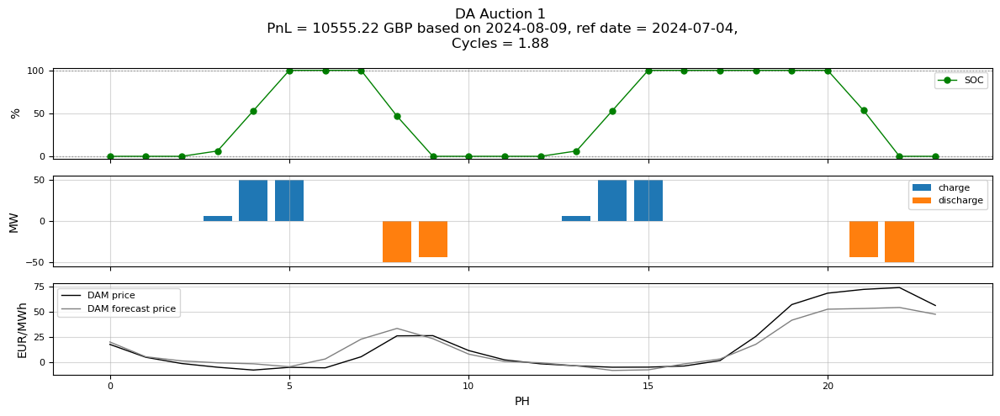

      del_date    ref_date    pnl_da
70  2024-08-09  2024-07-04  10555.22


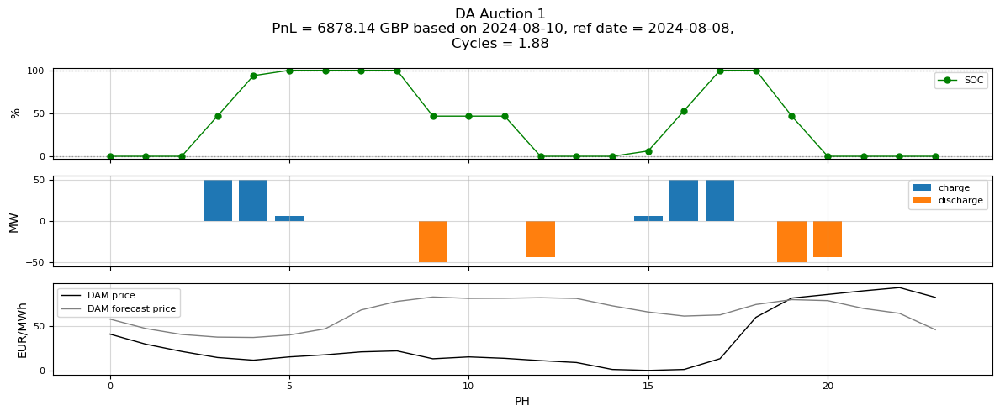

      del_date    ref_date   pnl_da
71  2024-08-10  2024-08-08  6878.14


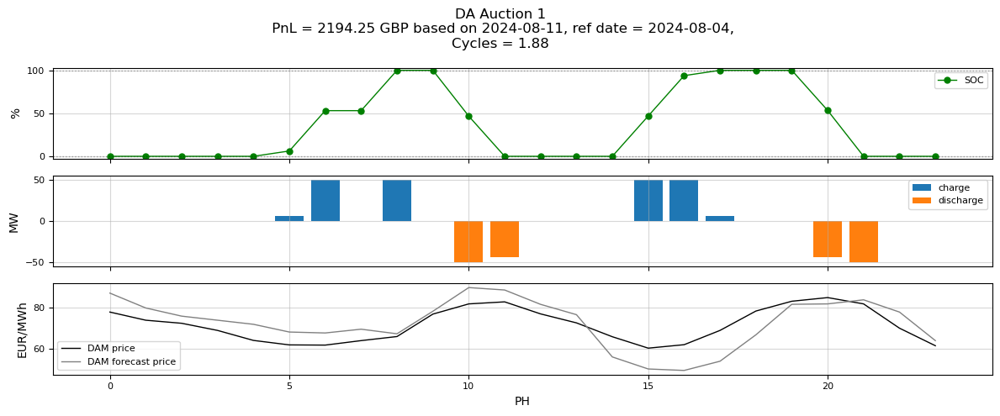

      del_date    ref_date   pnl_da
72  2024-08-11  2024-08-04  2194.25


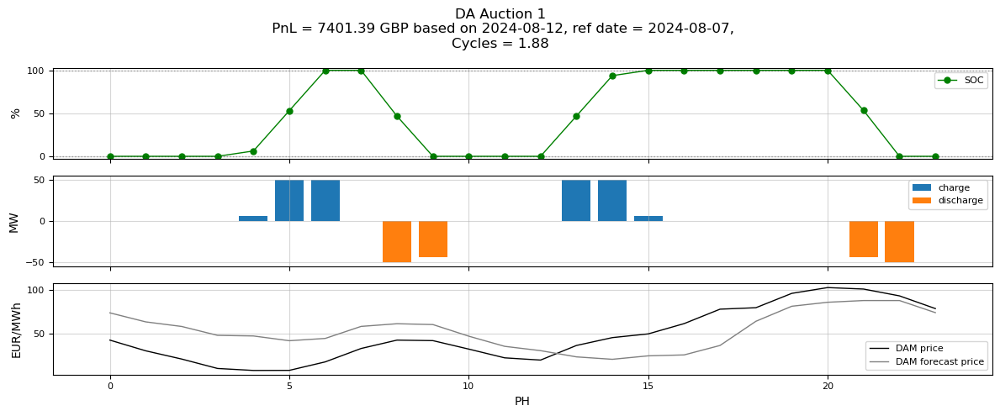

      del_date    ref_date   pnl_da
73  2024-08-12  2024-08-07  7401.39


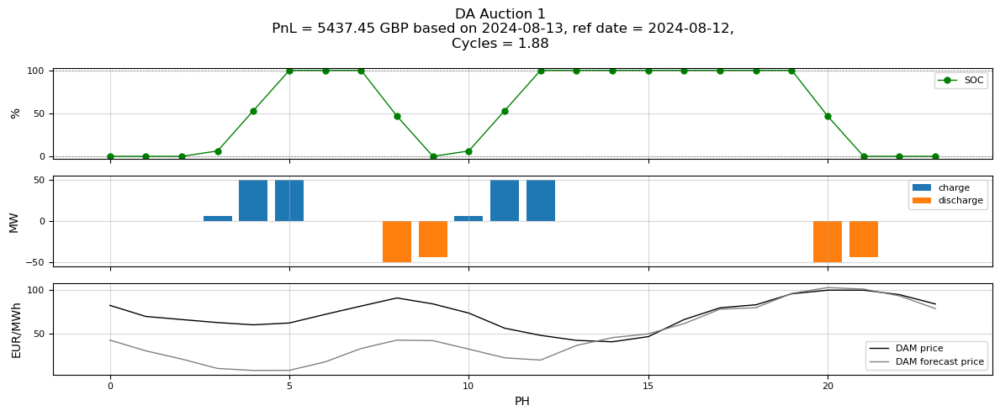

      del_date    ref_date   pnl_da
74  2024-08-13  2024-08-12  5437.45


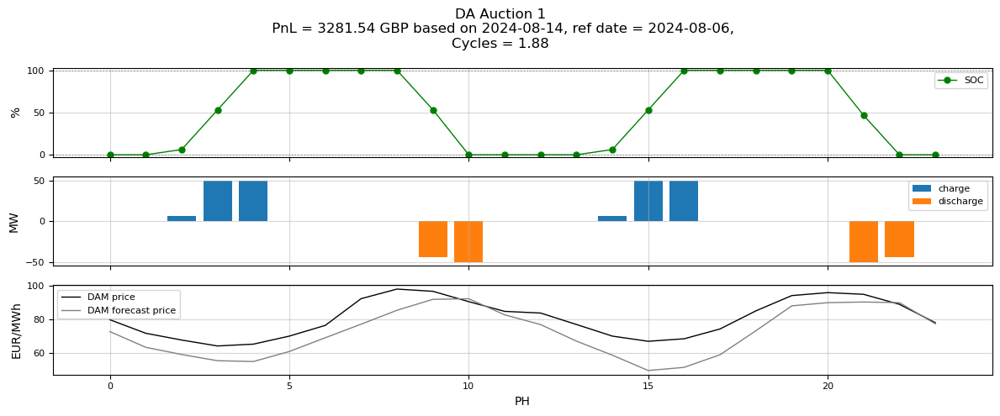

      del_date    ref_date   pnl_da
75  2024-08-14  2024-08-06  3281.54


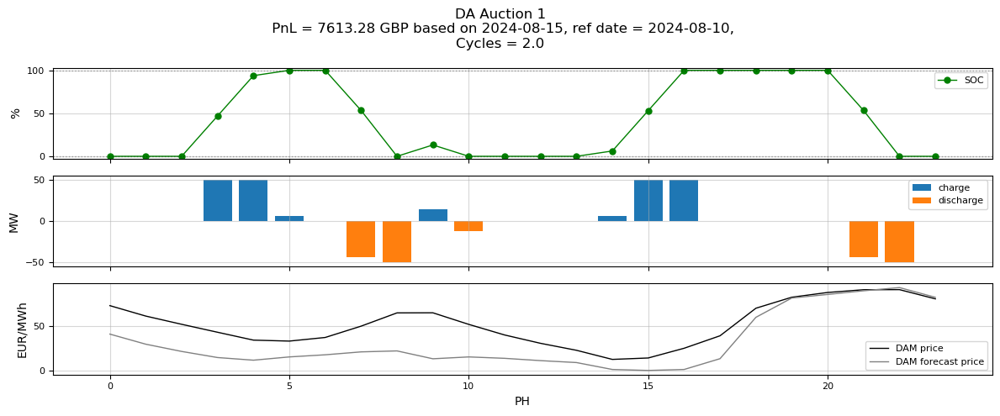

      del_date    ref_date   pnl_da
76  2024-08-15  2024-08-10  7613.28


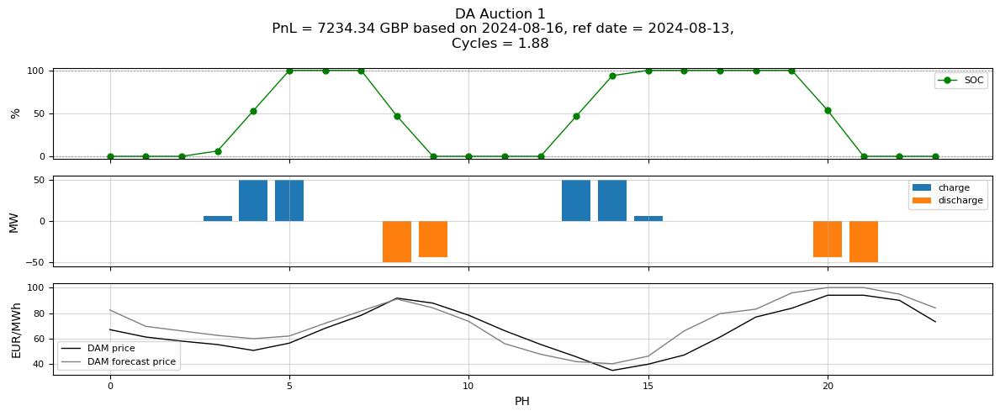

      del_date    ref_date   pnl_da
77  2024-08-16  2024-08-13  7234.34


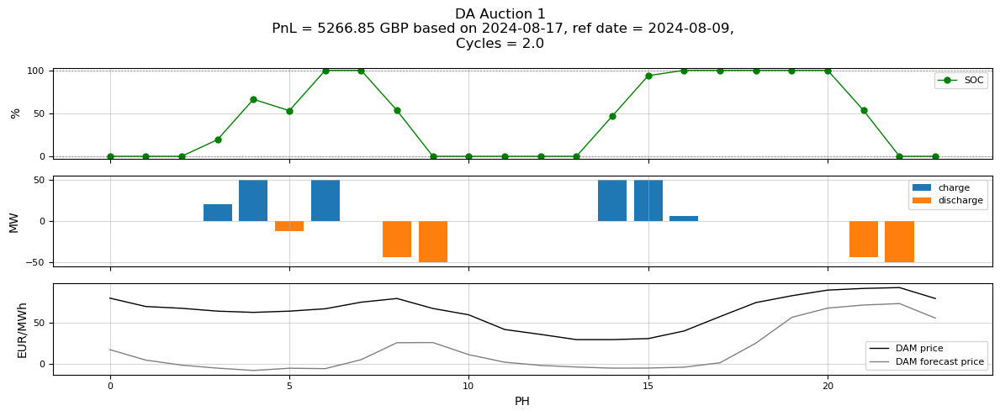

      del_date    ref_date   pnl_da
78  2024-08-17  2024-08-09  5266.85


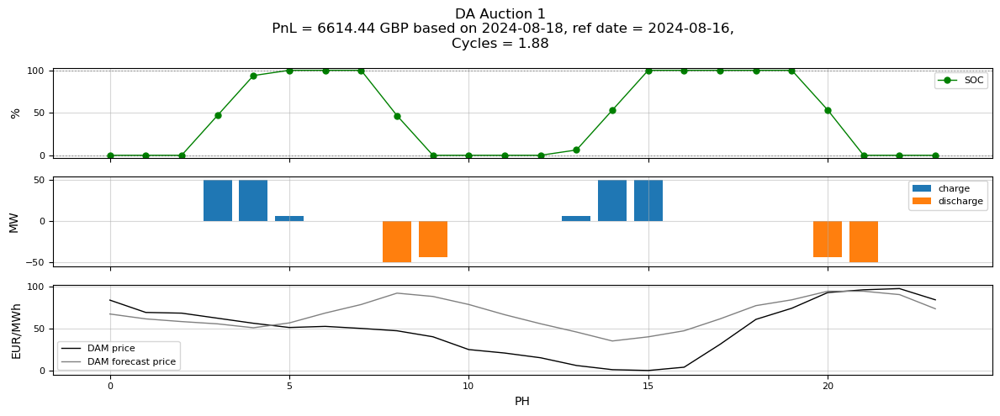

      del_date    ref_date   pnl_da
79  2024-08-18  2024-08-16  6614.44


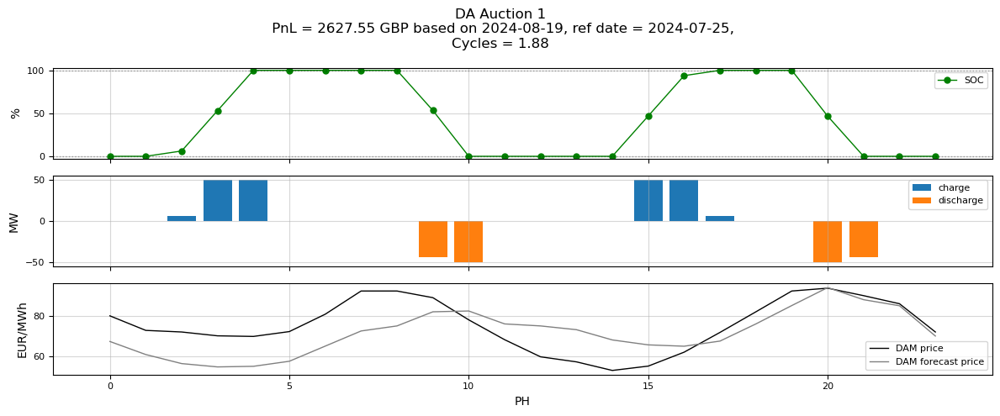

      del_date    ref_date   pnl_da
80  2024-08-19  2024-07-25  2627.55


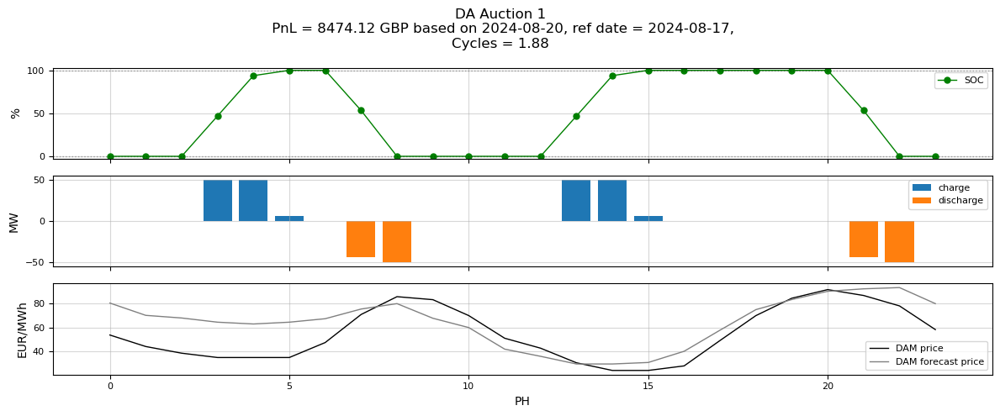

      del_date    ref_date   pnl_da
81  2024-08-20  2024-08-17  8474.12


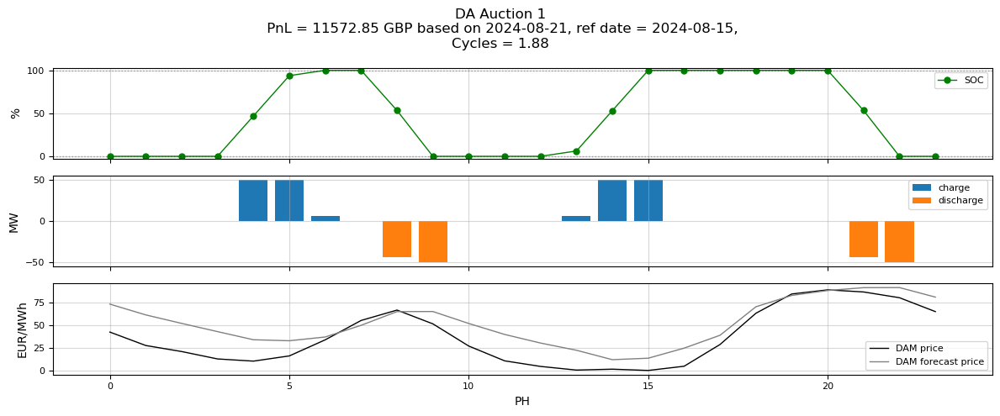

      del_date    ref_date    pnl_da
82  2024-08-21  2024-08-15  11572.85


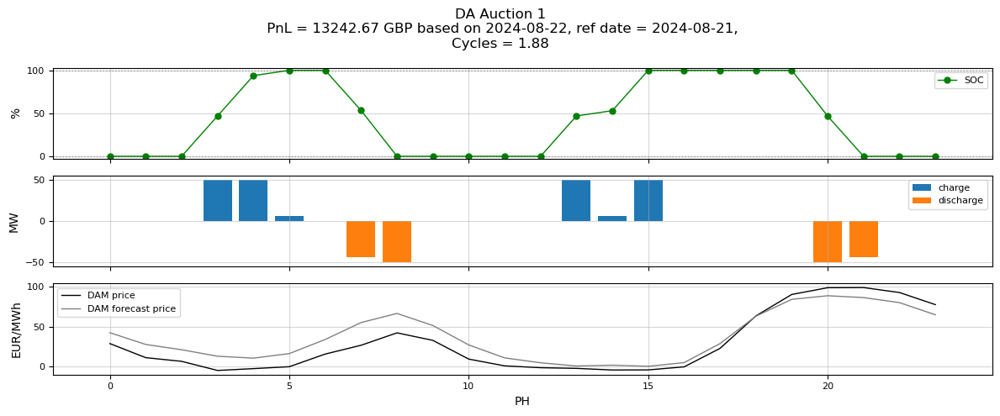

      del_date    ref_date    pnl_da
83  2024-08-22  2024-08-21  13242.67


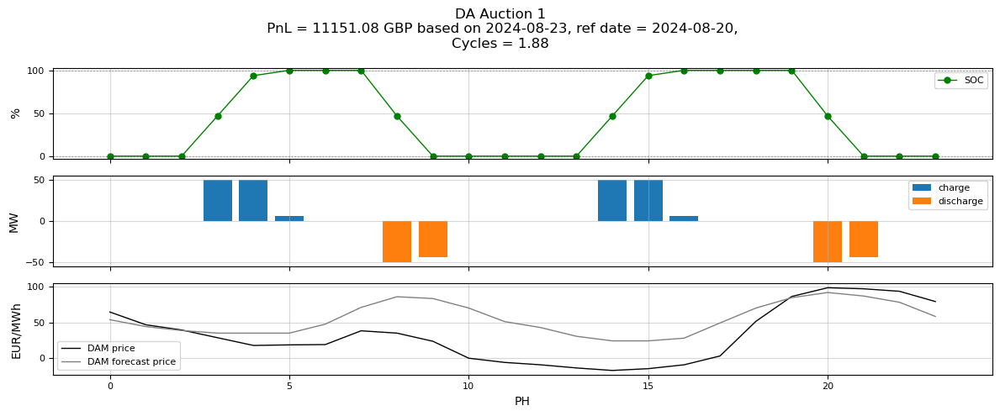

      del_date    ref_date    pnl_da
84  2024-08-23  2024-08-20  11151.08


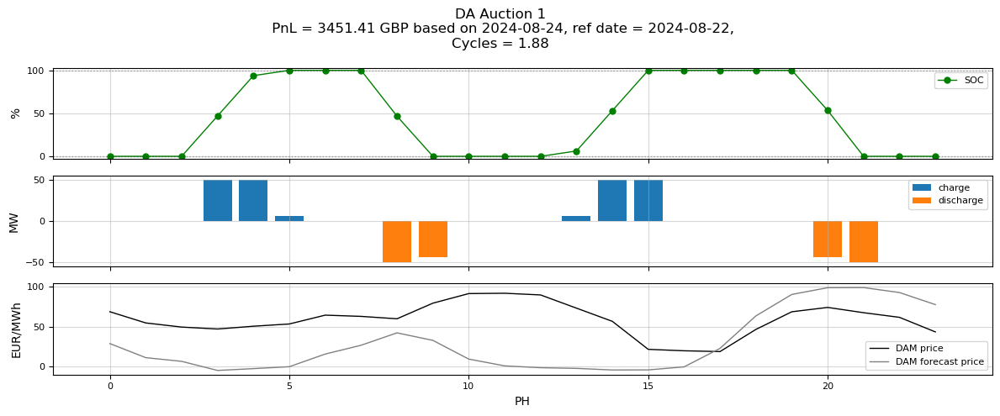

      del_date    ref_date   pnl_da
85  2024-08-24  2024-08-22  3451.41


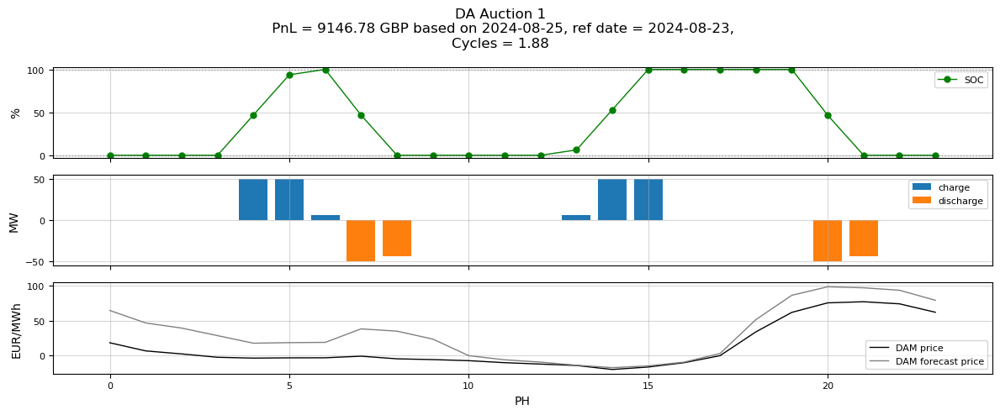

      del_date    ref_date   pnl_da
86  2024-08-25  2024-08-23  9146.78


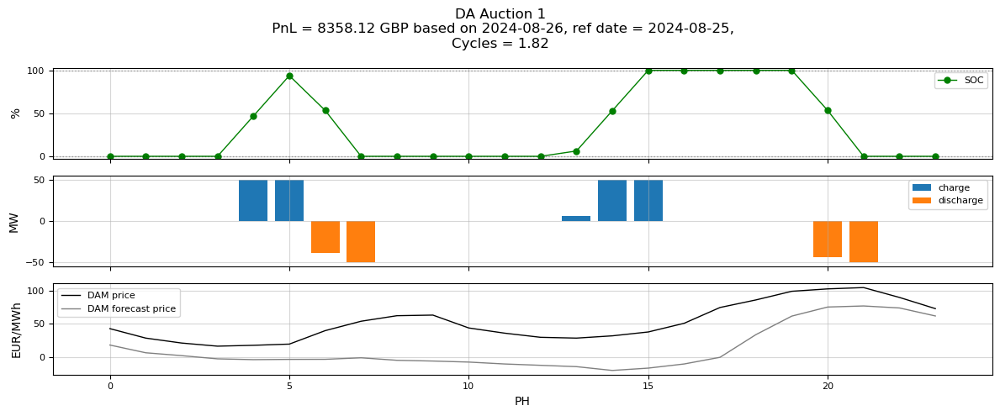

      del_date    ref_date   pnl_da
87  2024-08-26  2024-08-25  8358.12


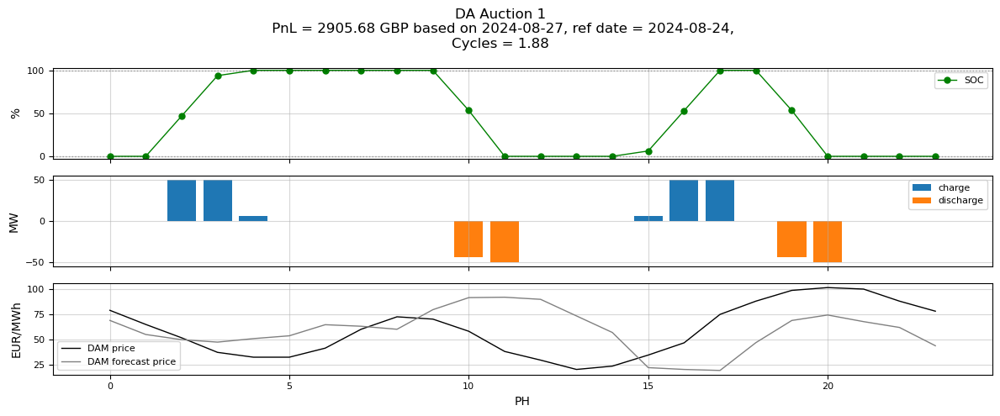

      del_date    ref_date   pnl_da
88  2024-08-27  2024-08-24  2905.68


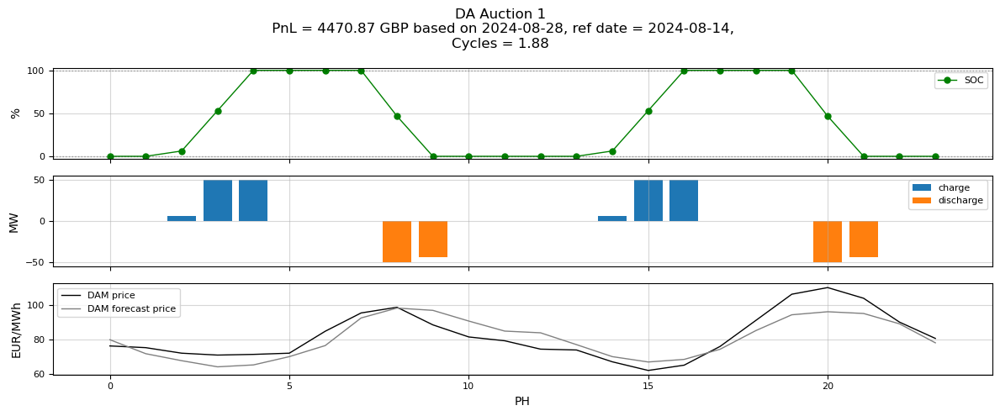

      del_date    ref_date   pnl_da
89  2024-08-28  2024-08-14  4470.87


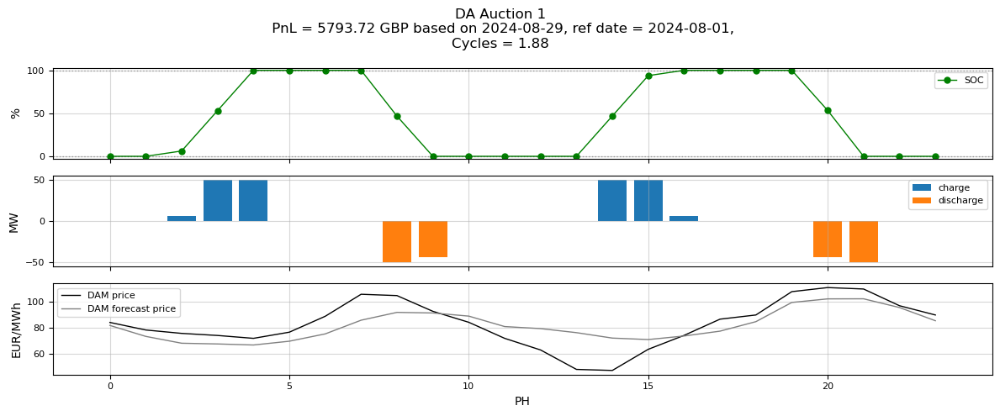

      del_date    ref_date   pnl_da
90  2024-08-29  2024-08-01  5793.72


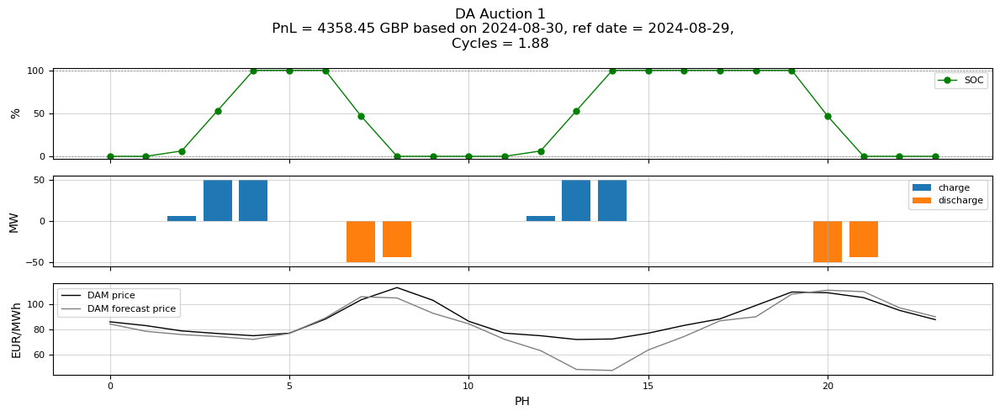

      del_date    ref_date   pnl_da
91  2024-08-30  2024-08-29  4358.45


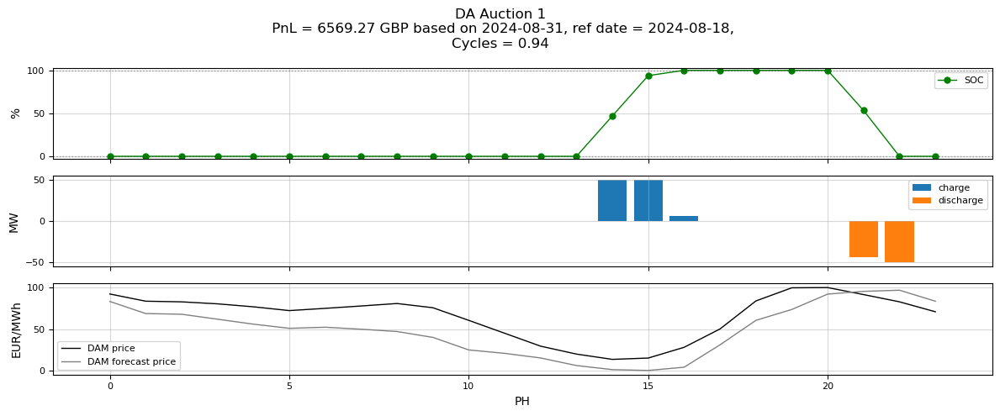

      del_date    ref_date   pnl_da
92  2024-08-31  2024-08-18  6569.27


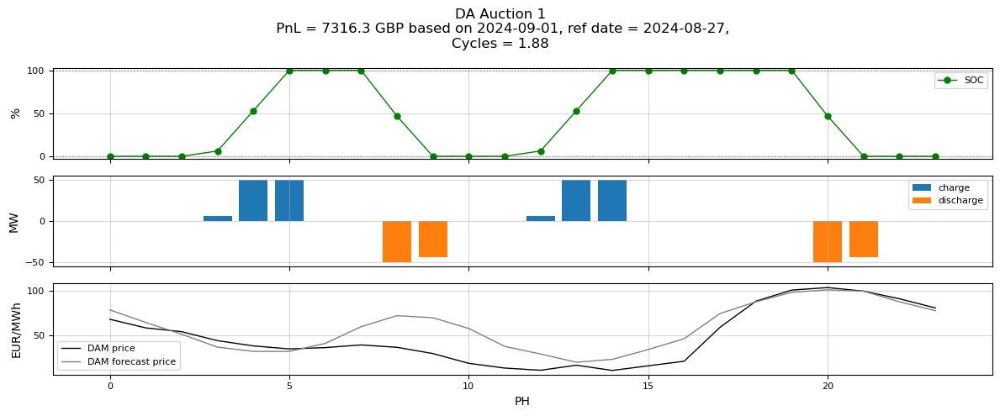

      del_date    ref_date  pnl_da
93  2024-09-01  2024-08-27  7316.3


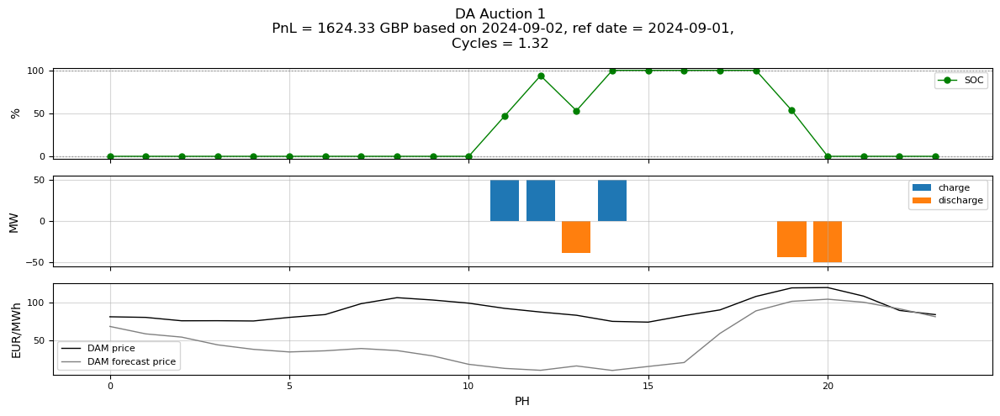

      del_date    ref_date   pnl_da
94  2024-09-02  2024-09-01  1624.33


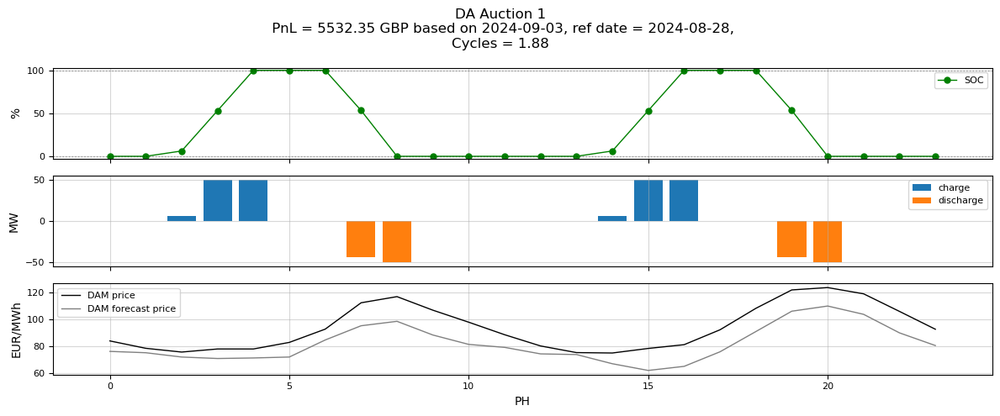

      del_date    ref_date   pnl_da
95  2024-09-03  2024-08-28  5532.35


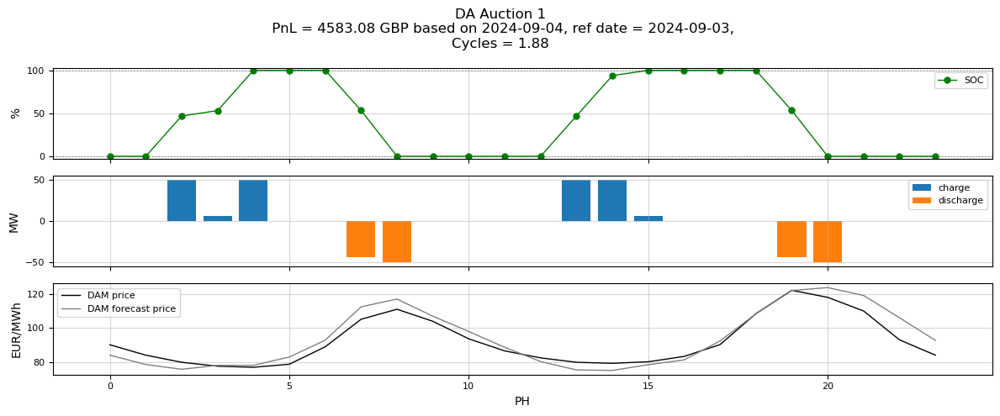

      del_date    ref_date   pnl_da
96  2024-09-04  2024-09-03  4583.08


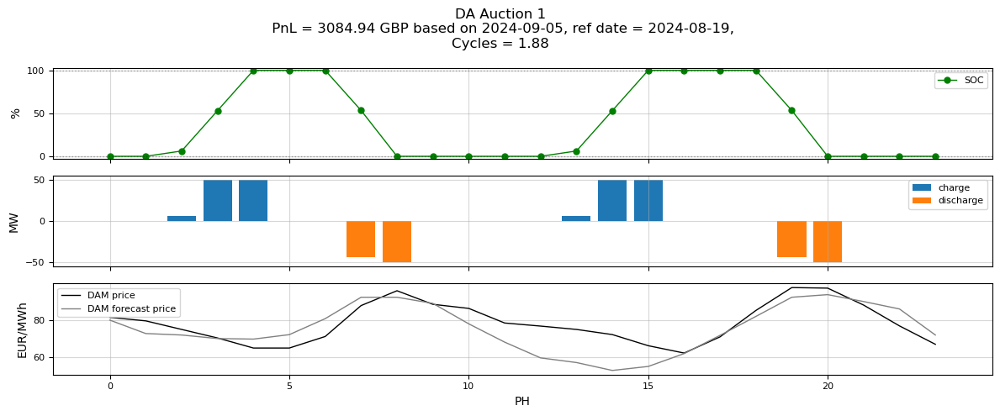

      del_date    ref_date   pnl_da
97  2024-09-05  2024-08-19  3084.94


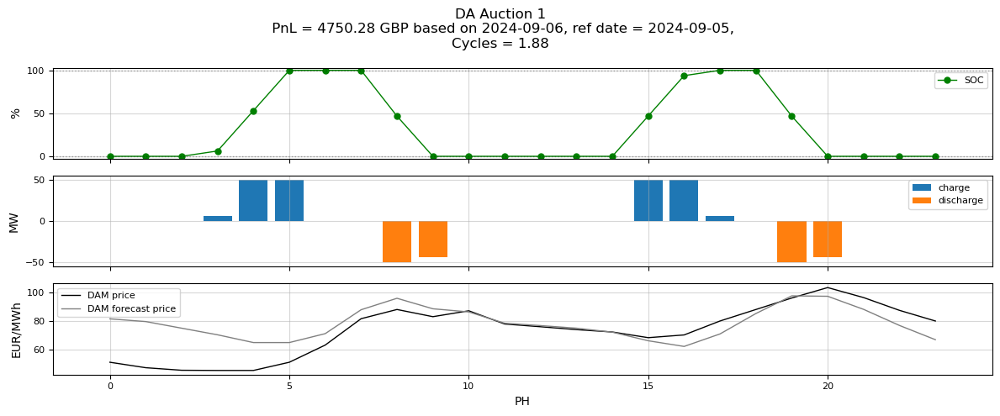

      del_date    ref_date   pnl_da
98  2024-09-06  2024-09-05  4750.28


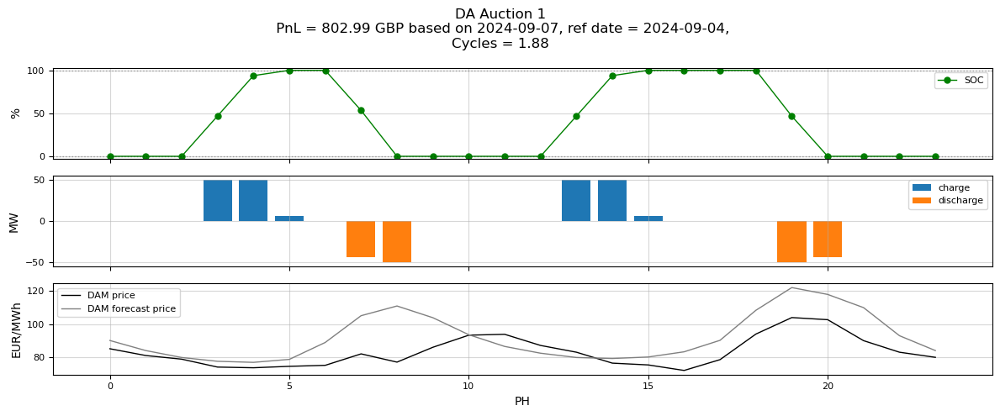

      del_date    ref_date  pnl_da
99  2024-09-07  2024-09-04  802.99


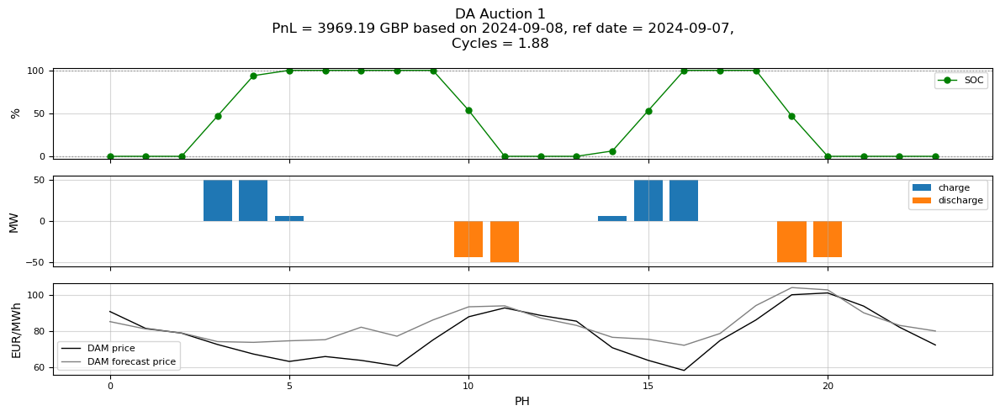

       del_date    ref_date   pnl_da
100  2024-09-08  2024-09-07  3969.19


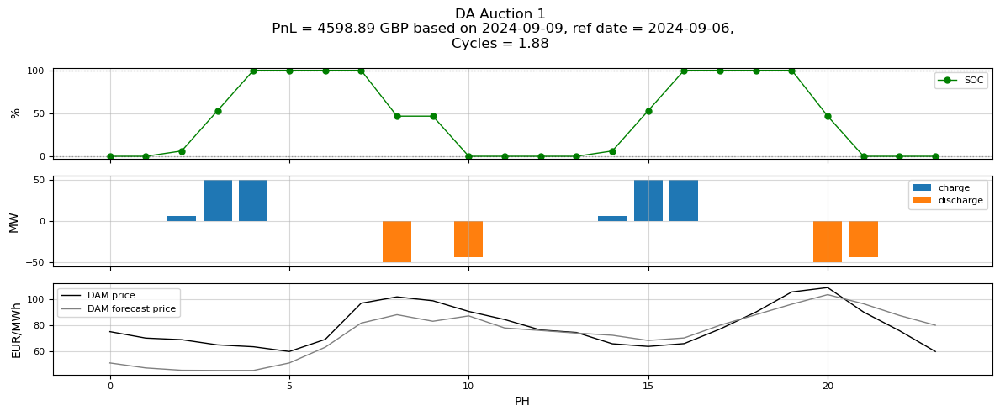

       del_date    ref_date   pnl_da
101  2024-09-09  2024-09-06  4598.89


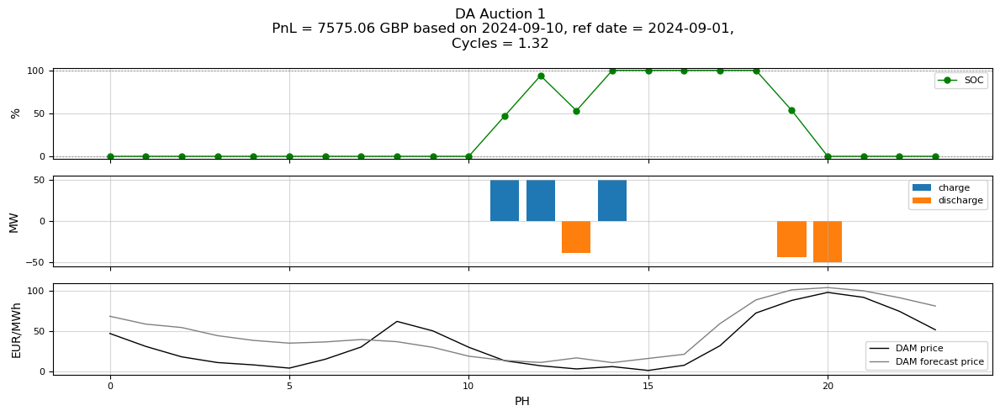

       del_date    ref_date   pnl_da
102  2024-09-10  2024-09-01  7575.06


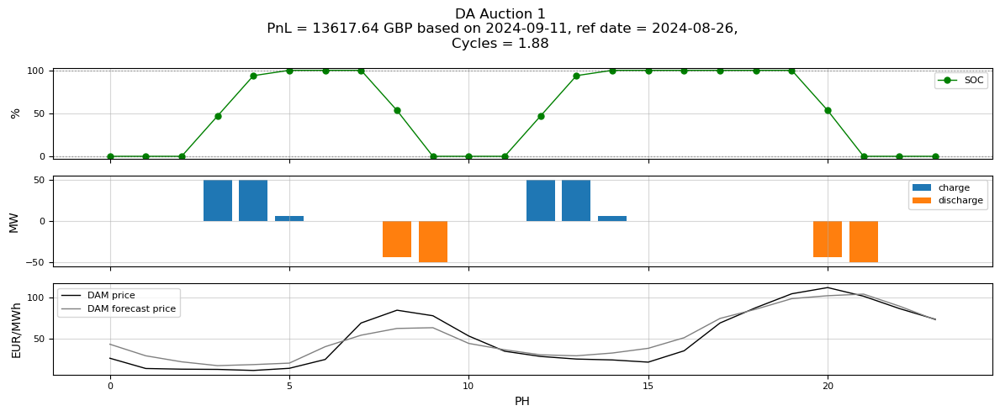

       del_date    ref_date    pnl_da
103  2024-09-11  2024-08-26  13617.64


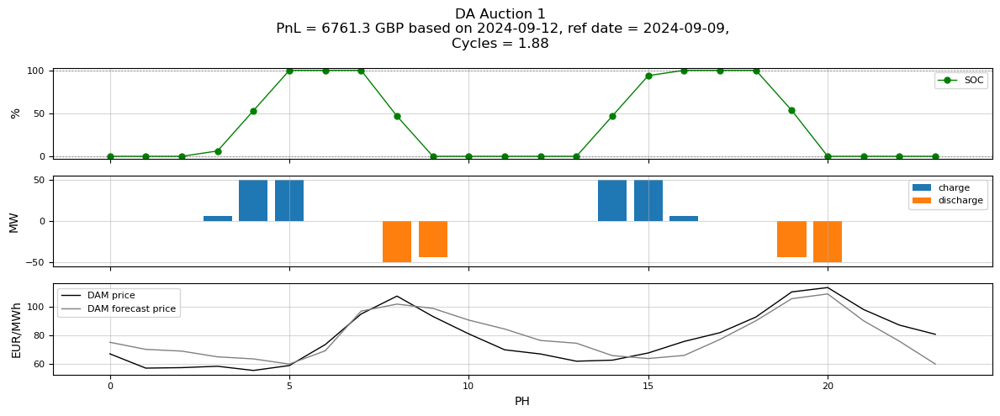

       del_date    ref_date  pnl_da
104  2024-09-12  2024-09-09  6761.3


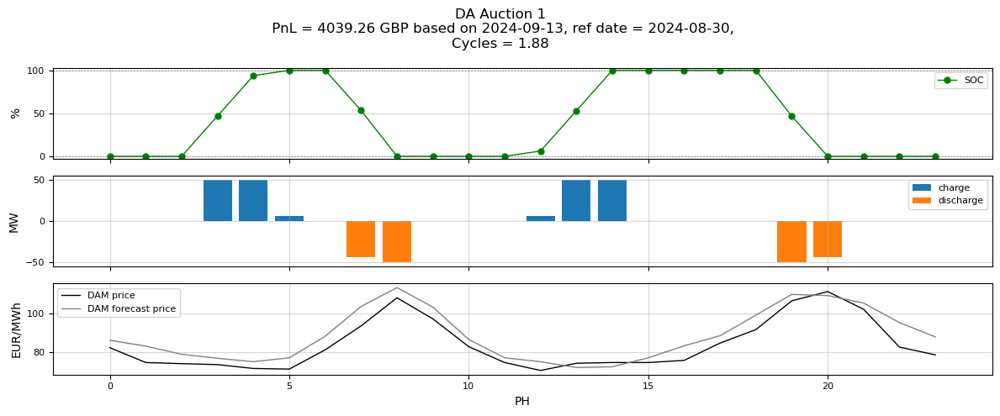

       del_date    ref_date   pnl_da
105  2024-09-13  2024-08-30  4039.26


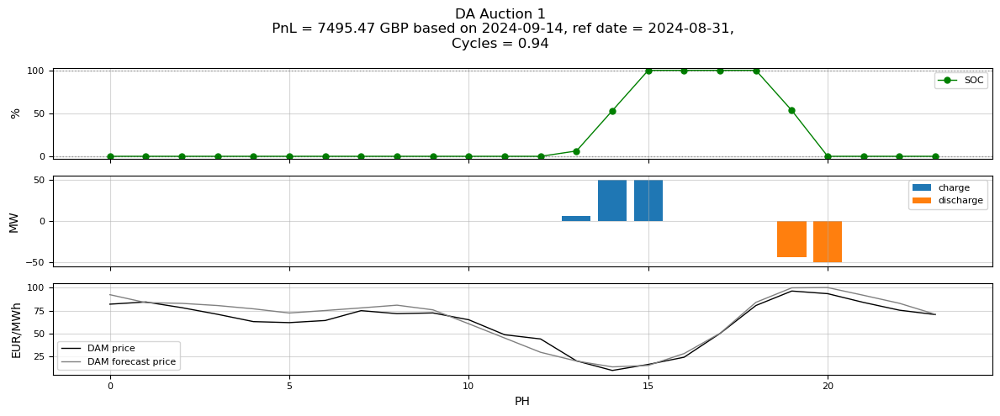

       del_date    ref_date   pnl_da
106  2024-09-14  2024-08-31  7495.47


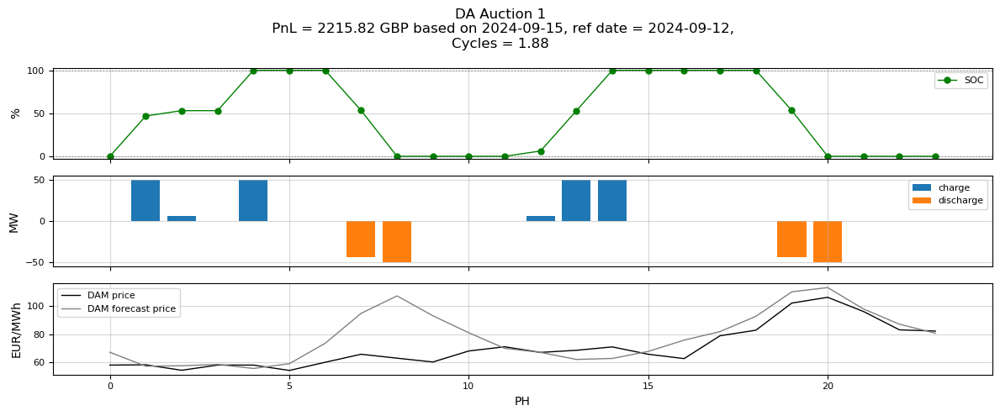

       del_date    ref_date   pnl_da
107  2024-09-15  2024-09-12  2215.82


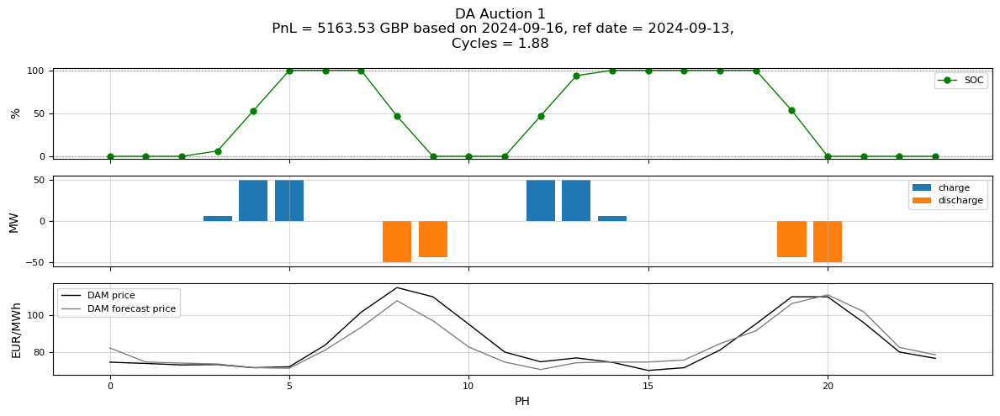

       del_date    ref_date   pnl_da
108  2024-09-16  2024-09-13  5163.53


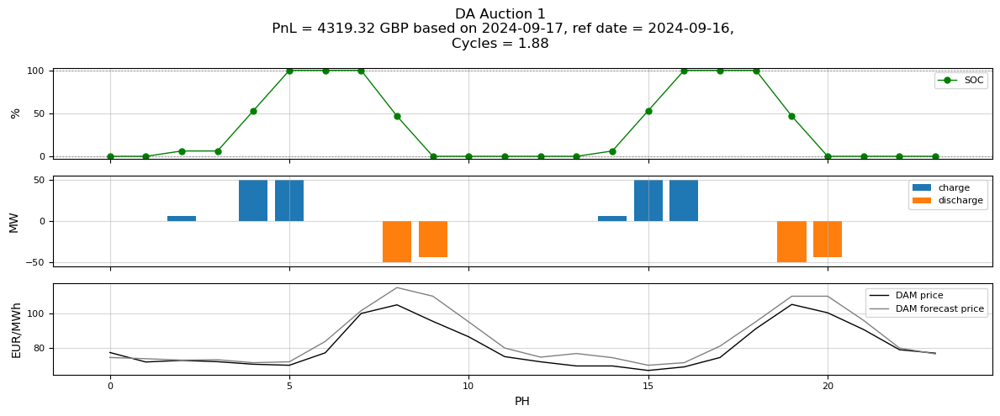

       del_date    ref_date   pnl_da
109  2024-09-17  2024-09-16  4319.32


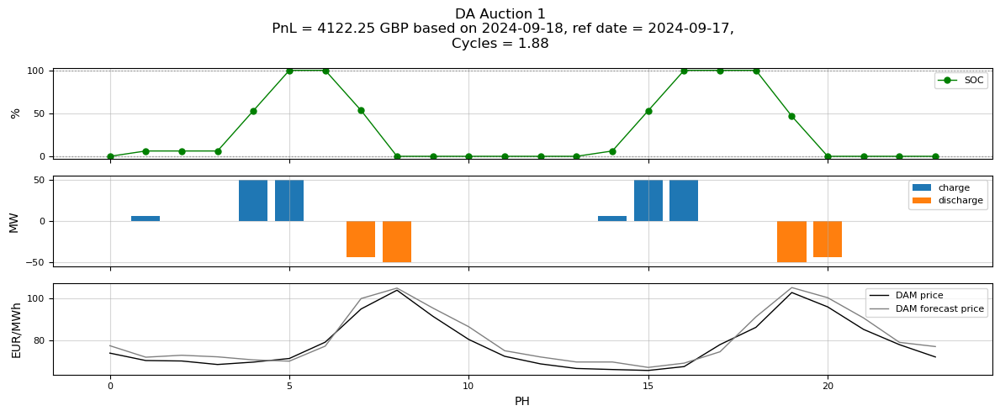

       del_date    ref_date   pnl_da
110  2024-09-18  2024-09-17  4122.25


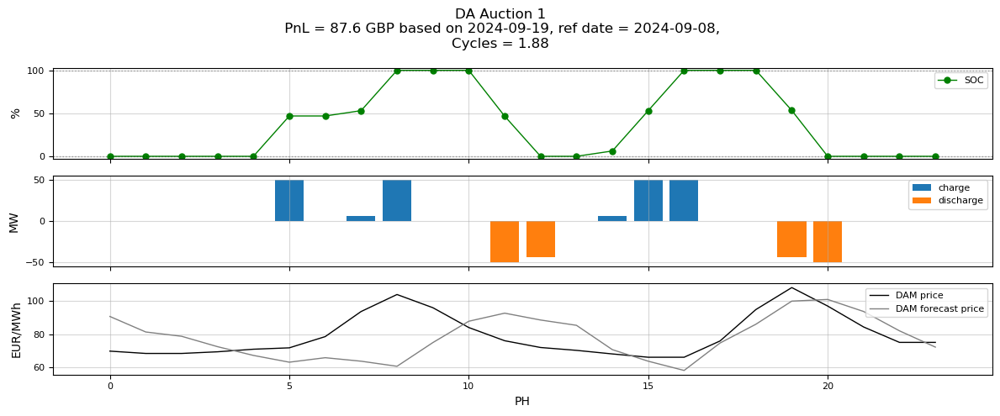

       del_date    ref_date  pnl_da
111  2024-09-19  2024-09-08    87.6


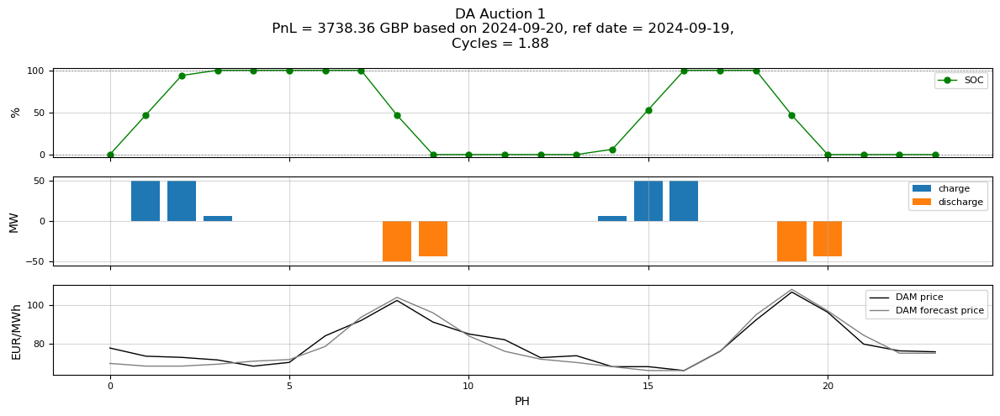

       del_date    ref_date   pnl_da
112  2024-09-20  2024-09-19  3738.36


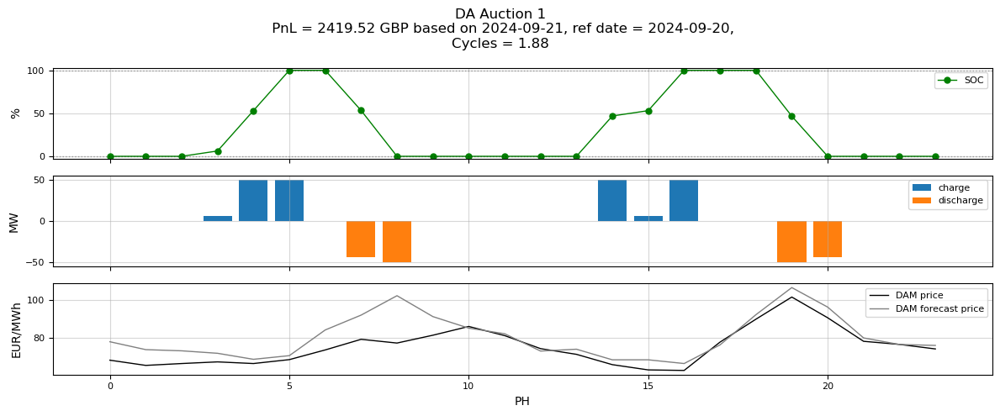

       del_date    ref_date   pnl_da
113  2024-09-21  2024-09-20  2419.52


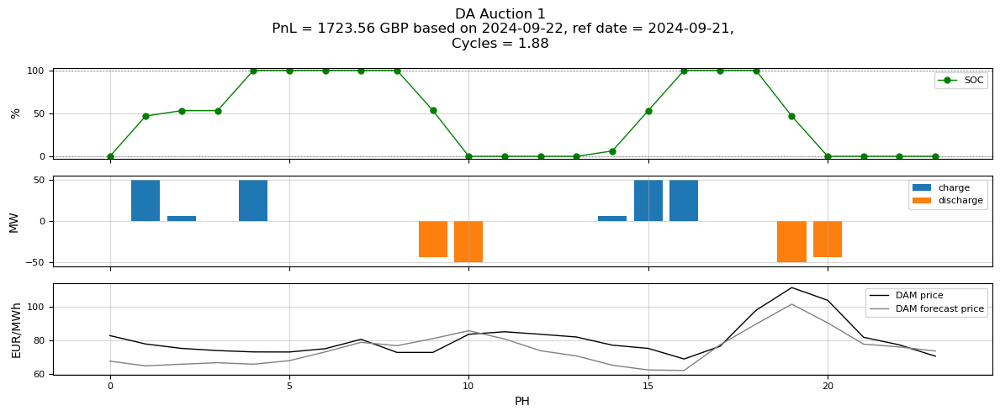

       del_date    ref_date   pnl_da
114  2024-09-22  2024-09-21  1723.56


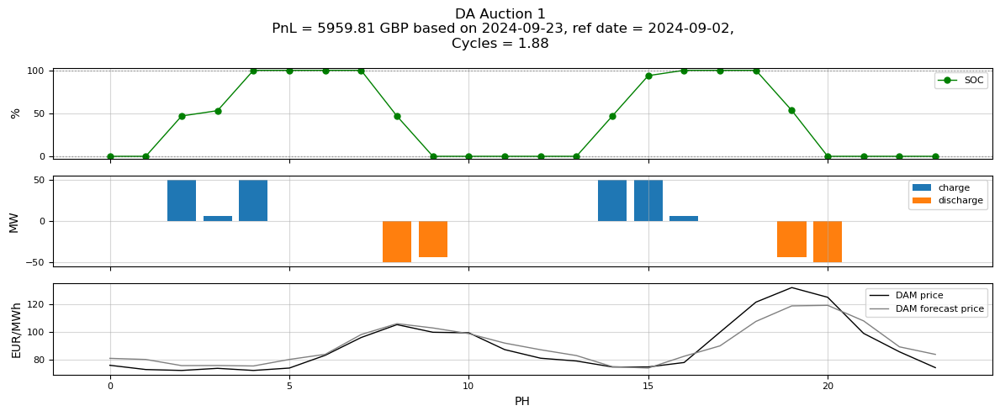

       del_date    ref_date   pnl_da
115  2024-09-23  2024-09-02  5959.81


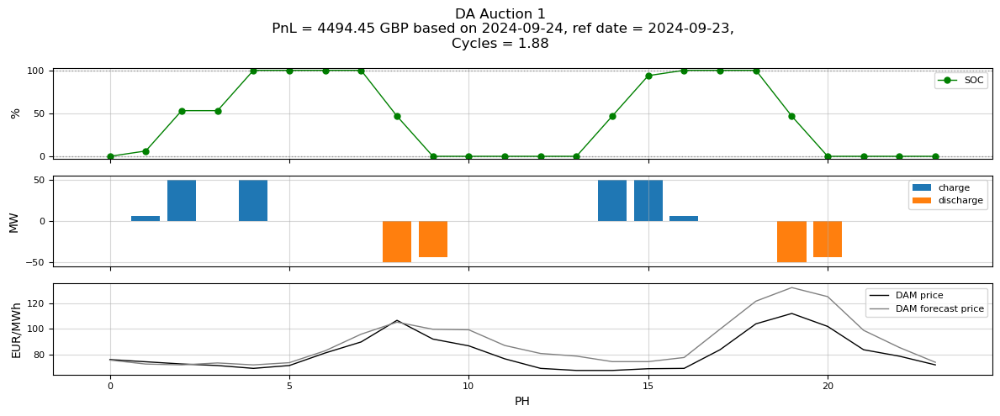

       del_date    ref_date   pnl_da
116  2024-09-24  2024-09-23  4494.45


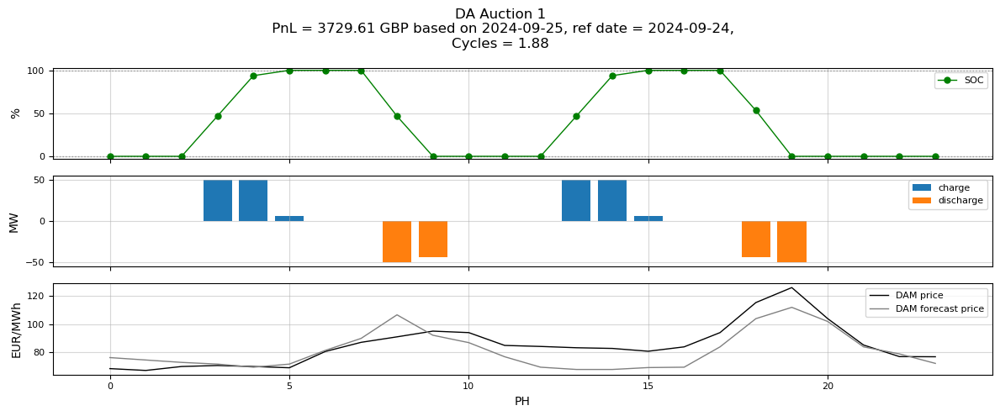

       del_date    ref_date   pnl_da
117  2024-09-25  2024-09-24  3729.61


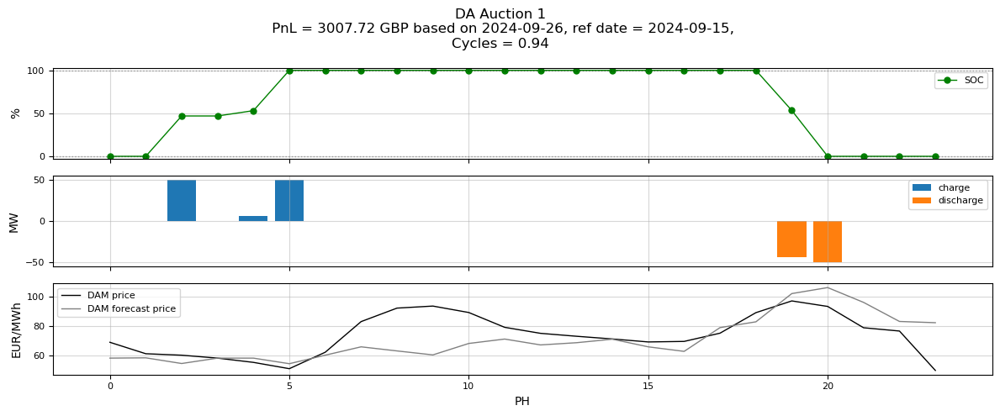

       del_date    ref_date   pnl_da
118  2024-09-26  2024-09-15  3007.72


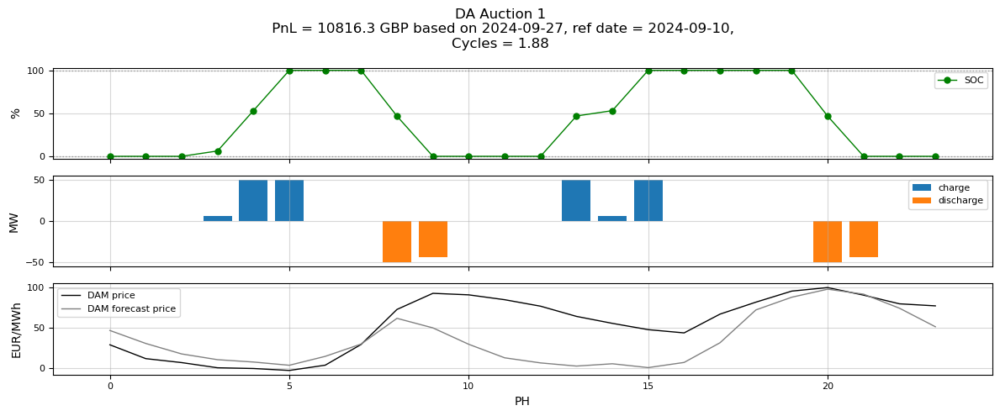

       del_date    ref_date   pnl_da
119  2024-09-27  2024-09-10  10816.3


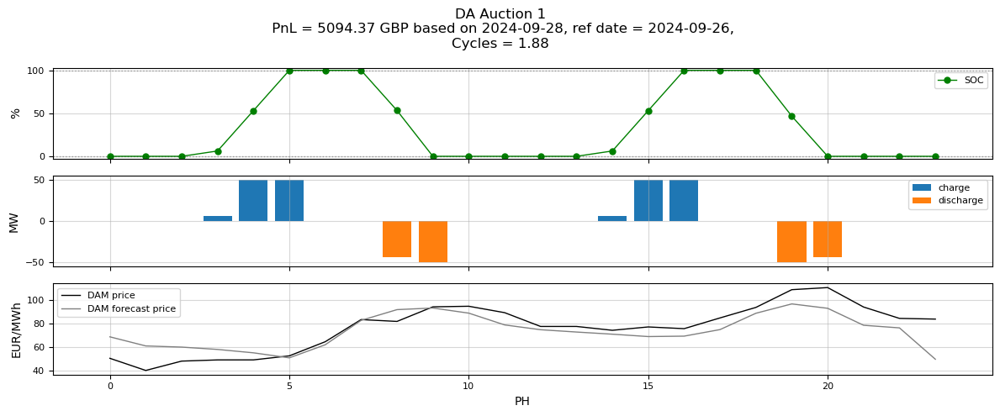

       del_date    ref_date   pnl_da
120  2024-09-28  2024-09-26  5094.37


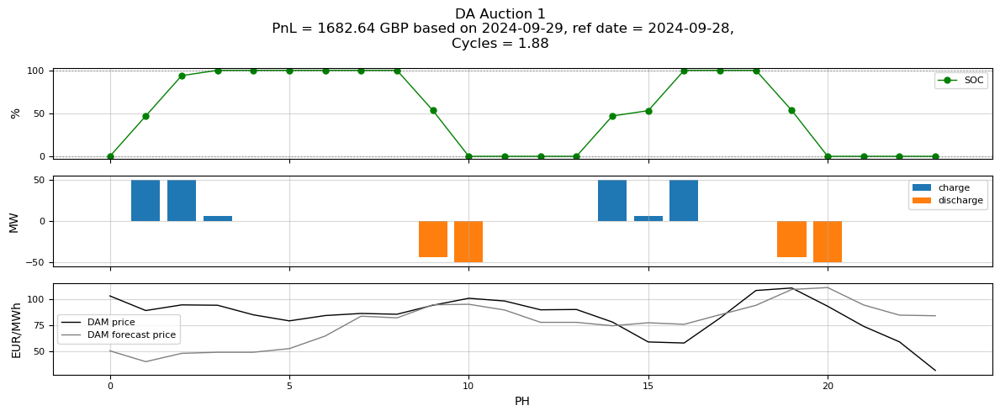

       del_date    ref_date   pnl_da
121  2024-09-29  2024-09-28  1682.64


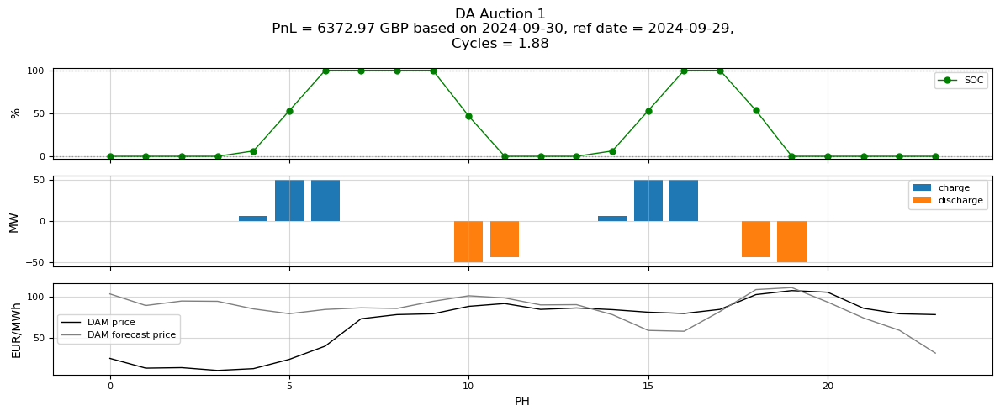

       del_date    ref_date   pnl_da
122  2024-09-30  2024-09-29  6372.97


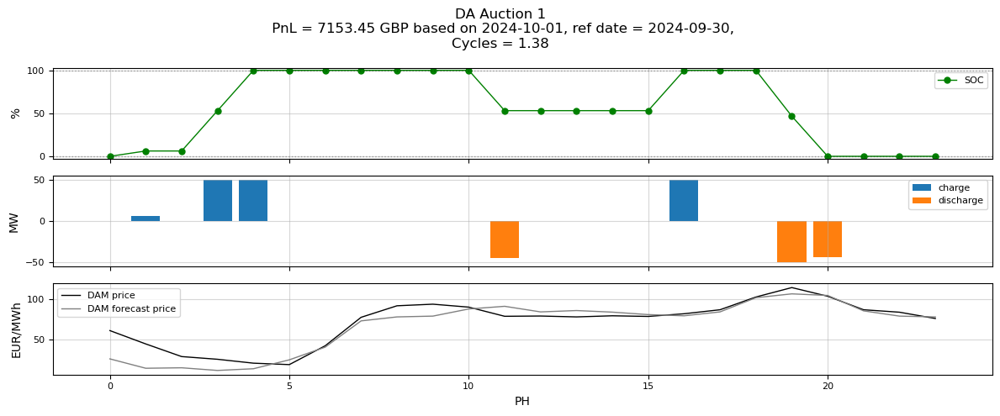

       del_date    ref_date   pnl_da
123  2024-10-01  2024-09-30  7153.45


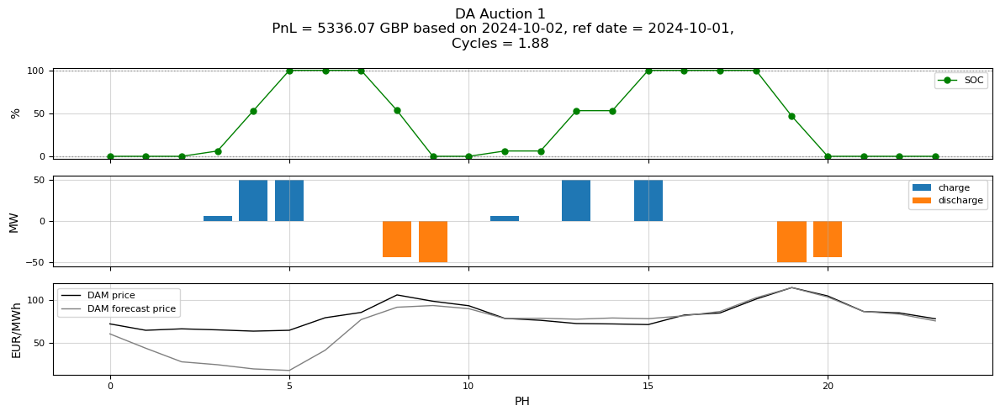

       del_date    ref_date   pnl_da
124  2024-10-02  2024-10-01  5336.07


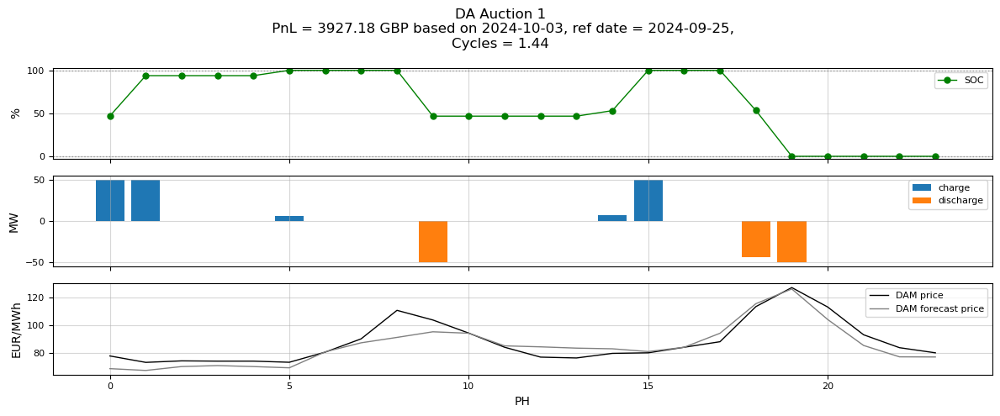

       del_date    ref_date   pnl_da
125  2024-10-03  2024-09-25  3927.18


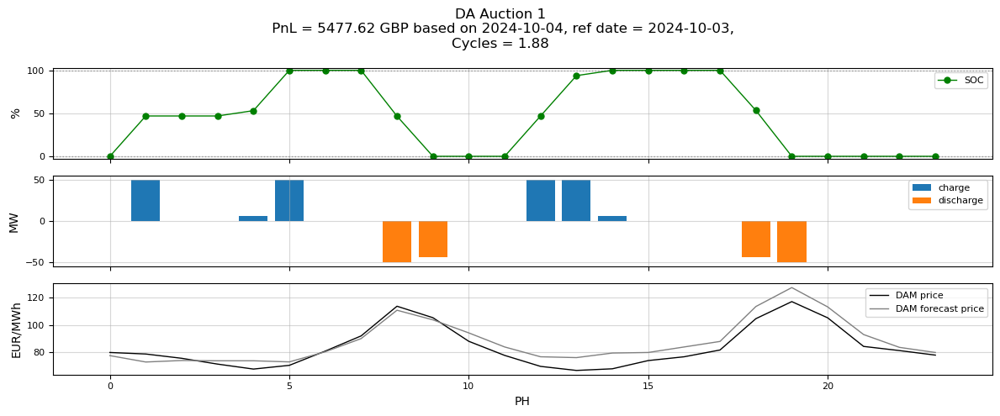

       del_date    ref_date   pnl_da
126  2024-10-04  2024-10-03  5477.62


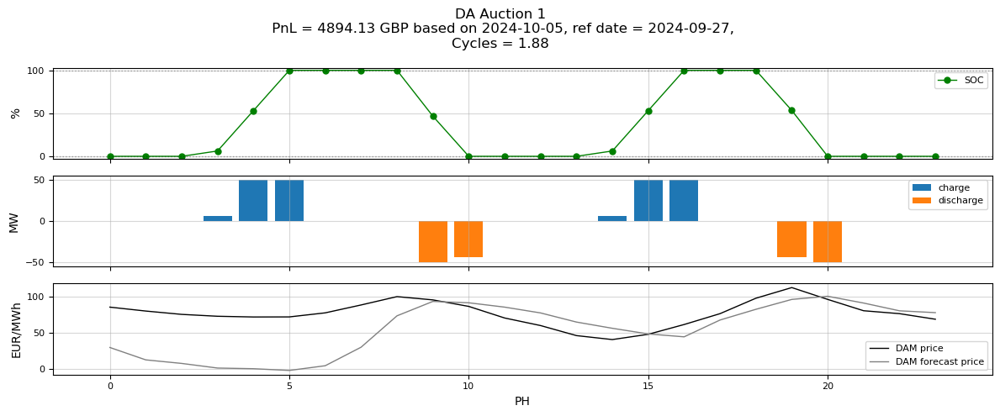

       del_date    ref_date   pnl_da
127  2024-10-05  2024-09-27  4894.13


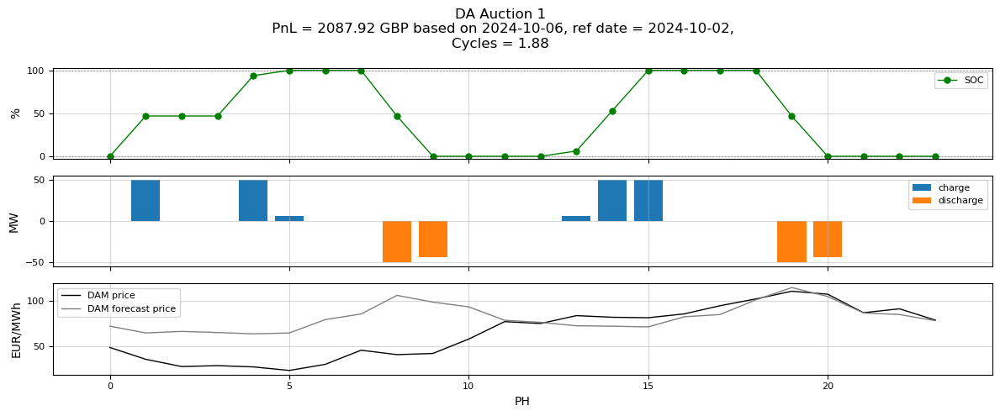

       del_date    ref_date   pnl_da
128  2024-10-06  2024-10-02  2087.92


In [ ]:
daily_log_refModel1 = pd.DataFrame()    # daily logs
hourly_log_refModel1 = pd.DataFrame()   # hourly logs

for del_date in dates[:]:

    ref_date = ref_day_data[ref_day_data.date == del_date].reference_day.iloc[0]
    # actuals, for price settlements
    del_da_data = da_data[da_data.date == del_date].reset_index(drop=True)
    
    # forecast for scheduling
    ref_da_data = da_data[da_data.date == ref_date].reset_index(drop=True)
    
    DAM_run = bess_object_dam.solving(
        dam_actual=del_da_data.da_price,  # for settlements
        dam_fc=ref_da_data.da_price,   # for scheduling
        plot=show_daily_plots,  # toggle plotting here
        title_text1="DA Auction 1",
        title_text2=f"{del_date}, ref date = {ref_date}",
    )
    DAM_run["dtutc"] = del_da_data.dtutc
    DAM_run["da_actual"] = del_da_data.da_price
    eod_soc = DAM_run.soc_end.iloc[-1]

    # logging
    hourly_log_refModel1 = pd.concat(
        [
            hourly_log_refModel1,
            DAM_run[
                ["net", "soc_start", "soc_end", "dtutc", "da_actual"]
            ],
        ],
        ignore_index=True,
    )
    daily_log_refModel1 = pd.concat(
        [
            daily_log_refModel1,
            pd.DataFrame(
                [
                    {
                        "del_date": del_date,
                        "ref_date": ref_date,
                        "pnl_da": bess_object_dam.pnl,
                    }
                ]
            ),
        ],
        ignore_index=True,
    )

    bess_object_dam.init_soc = eod_soc
    print(daily_log_refModel1.tail(1))

In [345]:
print(ref_day_data.columns)


Index(['date', 'closest_reference_day', 'euclidean_distance'], dtype='object')


In [376]:
daily_log_refModel1[pd.isna(daily_log_refModel1.pnl_da)]


,del_date,ref_date,pnl_da
149,2024-10-27,2024-10-24,NaN


In [377]:
daily_log_refModel1['pnl_da'] = daily_log_refModel1['pnl_da'].fillna(method='ffill')

In [378]:
daily_log_foresight[pd.isna(daily_log_foresight.pnl_da)]

,del_date,ref_date,pnl_da


In [379]:
print(daily_log_refModel1[pd.isna(daily_log_refModel1.pnl_da)])

Empty DataFrame
Columns: [del_date, ref_date, pnl_da]
Index: []


In [380]:
compare_df = daily_log_refModel1[['del_date', 'ref_date', 'pnl_da']].rename(columns = {"pnl_da": "pnl_da_ref"})
compare_df = compare_df.dropna(subset=['pnl_da_ref']).reset_index(drop=True)
compare_df

,del_date,ref_date,pnl_da_ref
0,2024-05-31,2024-05-30,5519.98
1,2024-06-01,2024-05-31,4688.58
2,2024-06-02,2024-06-01,5949.87
3,2024-06-03,2024-06-02,2948.91
4,2024-06-04,2024-06-03,5461.52
...,...,...,...
148,2024-10-26,2024-10-25,4462.54
149,2024-10-27,2024-10-24,4462.54
150,2024-10-28,2024-10-22,5917.03
151,2024-10-29,2024-10-26,6381.97


In [381]:
compare_df = compare_df.merge(daily_log_foresight[['del_date', 'pnl_da']], on = 'del_date', how = "left").rename(columns = {"pnl_da": "pnl_da_foresight"})

In [382]:
compare_df[['pnl_da_ref', 'pnl_da_foresight']].sum()

pnl_da_ref          729408.34
pnl_da_foresight    932817.84
dtype: float64

In [216]:
# using scipy.kmeans

712223.54/932817.84 * 100

76.35183520932662

In [115]:
# using sklearn.kmean and 10 clusters
729408.34/932817.84 * 100

78.19408127957759

In [150]:
#using sklearn.kmean and 5 clusters
701023.69/932817.84 * 100

75.15118814623013

In [247]:
# using euclidean
339341.15/632474.09 * 100

53.652972566828794

In [46]:
def get_sim(ref_day_table):
    
    dates = ref_day_table.date.unique()
    # initiate class object, once at the start of the simulation

    # initiate class object
    bess_object_dam = day_ahead(
        size=SIZE,
        power_up=POWER_UP,
        power_down=POWER_DOWN,
        timestep=1,
        charge_eff=CHARGE_EFFICIENCY,
        discharge_eff=DISCHARGE_EFFICIENCY,
        manual_soc_max=MANUAL_SOC_MAX,
        manual_soc_min=MANUAL_SOC_MIN,
        init_soc=INIT_SOC,
        end_soc=END_SOC,
        end_soc_limit_type=end_soc_limit_type,
        daily_cycle_max=MAX_THROUGHPUT_CYCLES,
        throughput_size=THROUGHPUT_SIZE,
        solution_time_limit=SOLUTION_TIME_LIMIT_SEC,
        integer_solution=INTEGER_PN,
    )

    daily_log = pd.DataFrame()

    for del_date in dates[:]:

        ref_date = ref_day_table[ref_day_table.date == del_date].closest_reference_day.iloc[0]

        # actuals, for price settlements
        del_da_data = da_data[da_data.date == del_date].reset_index(drop=True)
        
        # forecast for scheduling
        ref_da_data = da_data[da_data.date == ref_date].reset_index(drop=True)
        
        DAM_run = bess_object_dam.solving(
            dam_actual=del_da_data.da_price,  # for settlements
            dam_fc=ref_da_data.da_price,   # for scheduling
            plot=False,  # toggle plotting here
            title_text1="DA Auction 1",
            title_text2=f"{del_date}, ref date = {ref_date}",
        )
        
        eod_soc = DAM_run.soc_end.iloc[-1]

        # logging
        daily_log = pd.concat(
            [
                daily_log,
                pd.DataFrame(
                    [
                        {
                            "del_date": del_date,
                            "ref_date": ref_date,
                            "pnl_da": bess_object_dam.pnl,
                        }
                    ]
                ),
            ],
            ignore_index=True,
        )

        bess_object_dam.init_soc = eod_soc
        print(daily_log.tail(1))

    return daily_log

    

### discharge - end up losing more
### charge - end up gaining less

discharge_eff = 0.8
charge_eff = 0.8

dicharge with 10MW for 1 hr:
I will Lose: 10 * 1 * (1/0.8) = -12.5 MWh

Charge with 10MW for 1 hr:
I will gain: 10 * 1 * (0.8) = 8 MWh


In [5]:
# import pandas as pd


# cosine_df = pd.read_csv("../src/data/processed/reference_days_cosine_table.csv", parse_dates=["date"])
# actual_prices = pd.read_csv("../src/data/processed/gb_epex_da_actuals.csv", parse_dates=["date", "dtutc", "dtcet"])


# cosine_df["closest_reference_day"] = cosine_df["closest_reference_days"].apply(
#     lambda x: eval(x, {"Timestamp": pd.Timestamp})[0] if isinstance(x, str) else None
# )


# daily_actual_revenue = actual_prices.groupby("date")["da_price"].sum().reset_index()
# daily_actual_revenue.columns = ["del_date", "pnl_da_foresight"]


# cosine_df = cosine_df.merge(
#     daily_actual_revenue,
#     left_on="closest_reference_day",
#     right_on="del_date",
#     how="left"
# ).rename(columns={"pnl_da_foresight": "pnl_da_ref"})


# compare_df = cosine_df.merge(
#     daily_actual_revenue,
#     left_on="date",
#     right_on="del_date",
#     how="left"
# ).rename(columns={"pnl_da_foresight": "pnl_da_foresight"})


# total_ref_revenue = compare_df["pnl_da_ref"].sum()
# total_foresight_revenue = compare_df["pnl_da_foresight"].sum()
# perfect_foresight_ratio = (total_ref_revenue / total_foresight_revenue) * 100

# print(f"Perfect Foresight Ratio (Cosine): {perfect_foresight_ratio:.2f}%")


Perfect Foresight Ratio (Cosine): 96.83%


In [140]:
import pandas as pd

# Load reference days and actual DA prices
ref_df = pd.read_csv("../src/data/processed/reference_days.csv", parse_dates=["date"])
actual_prices = pd.read_csv("../src/data/processed/gb_epex_da_actuals.csv", parse_dates=["date", "dtutc", "dtcet"])

# Parse 'closest_reference_days' to extract the first reference day
def parse_closest_reference_days(row):
    try:
        # Use regex to extract all dates from the string
        import re
        date_matches = re.findall(r"Timestamp\('([^']+)'\)", row)
        # Return the first date if available
        return pd.to_datetime(date_matches[0]) if len(date_matches) > 0 else None
    except Exception as e:
        print(f"Error parsing row: {row}, Error: {e}")
        return None

ref_df["closest_reference_day"] = ref_df["closest_reference_days"].apply(parse_closest_reference_days)

# Ensure both 'closest_reference_day' and 'del_date' are datetime64[ns]
ref_df["closest_reference_day"] = pd.to_datetime(ref_df["closest_reference_day"])
daily_actual_revenue = actual_prices.groupby("date")["da_price"].sum().reset_index()
daily_actual_revenue.columns = ["del_date", "pnl_da_foresight"]
daily_actual_revenue["del_date"] = pd.to_datetime(daily_actual_revenue["del_date"])

# Merge reference day revenues into ref_df
ref_df = ref_df.merge(
    daily_actual_revenue,
    left_on="closest_reference_day",
    right_on="del_date",
    how="left"
).rename(columns={"pnl_da_foresight": "pnl_da_ref"})

# Merge actual delivery day revenues into ref_df
compare_df = ref_df.merge(
    daily_actual_revenue,
    left_on="date",
    right_on="del_date",
    how="left"
).rename(columns={"pnl_da_foresight": "pnl_da_foresight"})

# Handle missing values in 'pnl_da_ref' using forward fill (ffill)
compare_df["pnl_da_ref"] = compare_df["pnl_da_ref"].fillna(method="ffill")

# Calculate total revenues for reference and delivery days
total_ref_revenue = compare_df["pnl_da_ref"].sum()
total_foresight_revenue = compare_df["pnl_da_foresight"].sum()

# Calculate perfect foresight ratio
perfect_foresight_ratio = (total_ref_revenue / total_foresight_revenue) * 100

# Print results
print(f"Perfect Foresight Ratio: {perfect_foresight_ratio:.2f}%")


Perfect Foresight Ratio: 91.95%
